# Business Case

### Predict the number of confirmed cases, death cases and recovery cases of Covid 19 for future prediction.

In [1]:
# import important libraries 
import pandas as pd  # used for load the data, manipulation of data,data cleaning & analysis
import numpy as np  # used for numerical function
import seaborn as sns  # use for data visualization
import matplotlib.pyplot as plt  # use for data visualization
import warnings  # use for ignore the warnings
warnings.filterwarnings('ignore')

In [2]:
# load the data
confiremed_data = pd.read_csv('time_series_covid19_confirmed_global.csv')
confiremed_data

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
0,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,...,38641,38716,38772,38815,38855,38872,38883,38919,39044,39074
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,11185,11353,11520,11672,11816,11948,12073,12226,12385,12535
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,48007,48254,48496,48734,48966,49194,49413,49623,49826,50023
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,1344,1344,1438,1438,1483,1483,1564,1564,1564,1681
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,3335,3388,3439,3569,3675,3789,3848,3901,3991,4117
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,NaN,West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,...,29906,30574,31362,32250,33006,33843,34401,35003,35686,36151
262,NaN,Western Sahara,24.215500,-12.885800,0,0,0,0,0,0,...,10,10,10,10,10,10,10,10,10,10
263,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,...,2009,2011,2013,2016,2019,2022,2024,2026,2026,2028
264,NaN,Zambia,-13.133897,27.849332,0,0,0,0,0,0,...,13466,13539,13720,13819,13887,13928,14022,14070,14131,14175


In [3]:
pd.set_option('display.max_columns',None)  # Temporarily display all columns
pd.set_option('display.max_rows',None)  # Temporarily display all rows

In [4]:
confiremed_data

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
0,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,4,4,5,7,7,7,11,16,21,22,22,22,24,24,40,40,74,84,94,110,110,120,170,174,237,273,281,299,349,367,423,444,484,521,555,607,665,714,784,840,906,933,996,1026,1092,1176,1279,1351,1463,1531,1703,1828,1939,2171,2335,2469,2704,2894,3224,3392,3563,3778,4033,4402,4687,4963,5226,5639,6053,6402,6664,7072,7653,8145,8676,9216,9998,10582,11173,11831,12456,13036,13659,14525,15205,15750,16509,17267,18054,18969,19551,20342,20917,21459,22142,22890,23546,24102,24766,25527,26310,26874,27532,27878,28424,28833,29157,29481,29640,30175,30451,30616,30967,31238,31517,31836,32022,32324,32672,32951,33190,33384,33594,33908,34194,34366,34451,34455,34740,34994,35070,35229,35301,35475,35526,35615,35727,35928,35981,36036,36157,36263,36368,36471,36542,36675,36710,36710,36747,36782,36829,36896,37015,37054,37054,37162,37269,37345,37424,37431,37551,37596,37599,37599,37599,37856,37894,37953,37999,38054,38070,38113,38129,38140,38143,38162,38165,38196,38243,38288,38304,38324,38398,38494,38520,38544,38572,38606,38641,38716,38772,38815,38855,38872,38883,38919,39044,39074
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,10,12,23,33,38,42,51,55,59,64,70,76,89,104,123,146,174,186,197,212,223,243,259,277,304,333,361,377,383,400,409,416,433,446,467,475,494,518,539,548,562,584,609,634,663,678,712,726,736,750,766,773,782,789,795,803,820,832,842,850,856,868,872,876,880,898,916,933,946,948,949,964,969,981,989,998,1004,1029,1050,1076,1099,1122,1137,1143,1164,1184,1197,1212,1232,1246,1263,1299,1341,1385,1416,1464,1521,1590,1672,1722,1788,1838,1891,1962,1995,2047,2114,2192,2269,2330,2402,2466,2535,2580,2662,2752,2819,2893,2964,3038,3106,3188,3278,3371,3454,3571,3667,3752,3851,3906,4008,4090,4171,4290,4358,4466,4570,4637,4763,4880,4997,5105,5197,5276,5396,5519,5620,5750,5889,6016,6151,6275,6411,6536,6676,6817,6971,7117,7260,7380,7499,7654,7812,7967,8119,8275,8427,8605,8759,8927,9083,9195,9279,9

In [5]:
# load the data
death_data = pd.read_csv('time_series_covid19_deaths_global.csv')
death_data

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
0,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,2,4,4,4,4,4,4,4,6,6,7,7,11,14,14,15,15,18,18,21,23,25,30,30,30,33,36,36,40,42,43,47,50,57,58,60,64,68,72,85,90,95,104,106,109,115,120,122,127,132,136,153,168,169,173,178,187,193,205,216,218,219,220,227,235,246,249,257,265,270,294,300,309,327,357,369,384,405,426,446,451,471,478,491,504,546,548,569,581,598,618,639,675,683,703,721,733,746,774,807,819,826,864,898,920,936,957,971,994,1010,1012,1048,1094,1113,1147,1164,1181,1185,1186,1190,1211,1225,1248,1259,1269,1270,1271,1271,1272,1283,1284,1288,1288,1294,1298,1307,1312,1312,1328,1344,1354,1363,1363,1370,1375,1375,1375,1375,1385,1385,1385,1387,1389,1397,1401,1401,1402,1402,1402,1402,1406,1409,1409,1409,1409,1412,1415,1418,1420,1420,1420,1420,1420,1425,1426,1436,1436,1437,1437,1441,1444
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,2,2,2,2,2,4,5,5,6,8,10,10,11,15,15,16,17,20,20,21,22,22,23,23,23,23,23,24,25,26,26,26,26,26,26,27,27,27,27,28,28,30,30,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,32,32,33,33,33,33,33,33,33,33,33,33,33,34,34,34,34,34,35,36,36,36,36,37,38,39,42,43,44,44,45,47,49,51,53,55,58,62,65,69,72,74,76,79,81,83,83,85,89,93,95,97,101,104,107,111,112,113,117,120,123,128,134,138,144,148,150,154,157,161,166,172,176,182,188,189,193,199,200,205,208,213,219,225,228,230,232,234,238,240,245,250,254,259,263,266,271,275,280,284,290,296,301,306,312,316,319,321,322,324,327,330,334,338,340,343,347,353,358,362,364
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,3,4,4,4,7,9,11,15,17,17,19,21,25,26,29,31,35,44,58,86,105,130,152,173,193,205,235,256,275,293,313,326,336,348,364,367,375,384,392,402,407,415,419,425,432,437,444,450,453,459,463,465,470,476,483,488,494,502,507,515,522,529,536,542,548,555,561,568,575,582,592,600,609,61

In [6]:
# load the data
recovered_data = pd.read_csv('time_series_covid19_recovered_global.csv')
recovered_data

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
0,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,2,2,2,2,2,2,5,5,10,10,10,15,18,18,29,32,32,32,32,32,40,43,54,99,112,131,135,150,166,179,188,188,207,220,228,252,260,310,331,345,397,421,458,468,472,502,558,558,610,648,691,745,745,778,801,850,930,938,996,1040,1075,1097,1128,1138,1209,1259,1303,1328,1428,1450,1522,1585,1762,1830,1875,2171,2651,3013,3326,3928,4201,4725,5164,5508,6158,7660,7962,8292,8764,8841,9260,9869,10174,10306,10674,12604,13934,14131,15651,16041,17331,19164,19366,20103,20179,20700,20847,20882,21135,21216,21254,21454,22456,22824,23151,23273,23634,23741,23741,23924,24550,24602,24793,25180,25198,25358,25389,25471,25509,25509,25510,25669,25669,25742,25840,25903,25960,25960,26228,26415,26694,26714,26714,27166,27166,27166,27166,27166,27681,28016,28016,28180,28360,28440,29042,29046,29059,29063,29089,29089,29231,29315,29390,29713,30082,30537,30557,30715,31048,31129,31154,31234,31638,32073,32098,32503,32505,32576,32576,32576,32576
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,2,10,17,17,31,31,33,44,52,67,76,89,99,104,116,131,154,165,182,197,217,232,248,251,277,283,302,314,327,345,356,385,394,403,410,422,431,455,470,488,519,531,543,570,595,605,620,627,650,654,682,688,694,705,714,715,727,742,758,771,777,783,789,795,803,812,823,851,857,872,877,891,898,898,910,925,938,945,960,980,1001,1034,1039,1044,1055,1064,1077,1086,1114,1126,1134,1159,1195,1217,1250,1298,1346,1384,1438,1459,1516,1559,1592,1637,1657,1702,1744,1791,1832,1875,1881,1946,2014,2062,2091,2137,2214,2264,2311,2352,2397,2463,2523,2608,2637,2682,2745,2789,2830,2883,2952,2961,3018,3031,3031,3123,3155,3227,3268,3342,3379,3480,3552,3616,3695,3746,3794,3816,3871,3928,3986,4096,4184,4332,4413,4530,4633,4791,4923,5020,5139,5214,5441,5582,5732,5882,5976,6106,6186,6239,6284,6346,6443,6494,6569,6615,6668,6733,6788,6831,6888,6940,6995
2,NaN,Algeria,28.033900,1.659600,0,0

## Domain Analysis

#### **Attribute Information**

**Province/State** : It is showing the state of country. It may contain NaN if the data is reported only at the country level.

**Country/Region** : The country or region name where the cases are recorded.

**Lat** : The latitude coordinate of the location.

**Long** : The longitude coordinate of the location.

**Dates ('1/22/20' - '9/21/20')**: It is showing how many cases come per day.
  * For the **Confirmed Cases** dataset, the value on a date is the total number of confirmed cases of Covid19.
  * For the **Death Cases** dataset, the value is the cumulative number of deaths.
  * For the **Recovered Case**s dataset, the value is the cumulative number of recovered cases. 

## Basic Checks :

In [7]:
confiremed_data.head()  # shows the first 5 rows

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,4,4,5,7,7,7,11,16,21,22,22,22,24,24,40,40,74,84,94,110,110,120,170,174,237,273,281,299,349,367,423,444,484,521,555,607,665,714,784,840,906,933,996,1026,1092,1176,1279,1351,1463,1531,1703,1828,1939,2171,2335,2469,2704,2894,3224,3392,3563,3778,4033,4402,4687,4963,5226,5639,6053,6402,6664,7072,7653,8145,8676,9216,9998,10582,11173,11831,12456,13036,13659,14525,15205,15750,16509,17267,18054,18969,19551,20342,20917,21459,22142,22890,23546,24102,24766,25527,26310,26874,27532,27878,28424,28833,29157,29481,29640,30175,30451,30616,30967,31238,31517,31836,32022,32324,32672,32951,33190,33384,33594,33908,34194,34366,34451,34455,34740,34994,35070,35229,35301,35475,35526,35615,35727,35928,35981,36036,36157,36263,36368,36471,36542,36675,36710,36710,36747,36782,36829,36896,37015,37054,37054,37162,37269,37345,37424,37431,37551,37596,37599,37599,37599,37856,37894,37953,37999,38054,38070,38113,38129,38140,38143,38162,38165,38196,38243,38288,38304,38324,38398,38494,38520,38544,38572,38606,38641,38716,38772,38815,38855,38872,38883,38919,39044,39074
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,10,12,23,33,38,42,51,55,59,64,70,76,89,104,123,146,174,186,197,212,223,243,259,277,304,333,361,377,383,400,409,416,433,446,467,475,494,518,539,548,562,584,609,634,663,678,712,726,736,750,766,773,782,789,795,803,820,832,842,850,856,868,872,876,880,898,916,933,946,948,949,964,969,981,989,998,1004,1029,1050,1076,1099,1122,1137,1143,1164,1184,1197,1212,1232,1246,1263,1299,1341,1385,1416,1464,1521,1590,1672,1722,1788,1838,1891,1962,1995,2047,2114,2192,2269,2330,2402,2466,2535,2580,2662,2752,2819,2893,2964,3038,3106,3188,3278,3371,3454,3571,3667,3752,3851,3906,4008,4090,4171,4290,4358,4466,4570,4637,4763,4880,4997,5105,5197,5276,5396,5519,5620,5750,5889,6016,6151,6275,6411,6536,6676,6817,6971,7117,7260,7380,7499,7654,7812,7967,8119,8275,8427,8605,8759,8927,9083,9195,9279,938

In [8]:
confiremed_data.info()  # gives the information of the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 266 entries, 0 to 265
Columns: 248 entries, Province/State to 9/21/20
dtypes: float64(2), int64(244), object(2)
memory usage: 515.5+ KB


In [9]:
confiremed_data.describe()  # gives the statistical information about the data

,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
count,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.00000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.660000e+02,2.

In [10]:
confiremed_data.describe(include='O')  # gettting the statistical information for evry categorical columns

,Province/State,Country/Region
count,81,266
unique,81,188
top,Australian Capital Territory,China
freq,1,33


**Insights**
* Confiremed_data dataset have 266 rows and 248 columns.
* There are 2 float, 2 object and 244 int datatype column.
* Here we can see that State have 81 unique value and Country have 188 unique values.

In [11]:
death_data.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,2,4,4,4,4,4,4,4,6,6,7,7,11,14,14,15,15,18,18,21,23,25,30,30,30,33,36,36,40,42,43,47,50,57,58,60,64,68,72,85,90,95,104,106,109,115,120,122,127,132,136,153,168,169,173,178,187,193,205,216,218,219,220,227,235,246,249,257,265,270,294,300,309,327,357,369,384,405,426,446,451,471,478,491,504,546,548,569,581,598,618,639,675,683,703,721,733,746,774,807,819,826,864,898,920,936,957,971,994,1010,1012,1048,1094,1113,1147,1164,1181,1185,1186,1190,1211,1225,1248,1259,1269,1270,1271,1271,1272,1283,1284,1288,1288,1294,1298,1307,1312,1312,1328,1344,1354,1363,1363,1370,1375,1375,1375,1375,1385,1385,1385,1387,1389,1397,1401,1401,1402,1402,1402,1402,1406,1409,1409,1409,1409,1412,1415,1418,1420,1420,1420,1420,1420,1425,1426,1436,1436,1437,1437,1441,1444
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,2,2,2,2,2,4,5,5,6,8,10,10,11,15,15,16,17,20,20,21,22,22,23,23,23,23,23,24,25,26,26,26,26,26,26,27,27,27,27,28,28,30,30,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,31,32,32,33,33,33,33,33,33,33,33,33,33,33,34,34,34,34,34,35,36,36,36,36,37,38,39,42,43,44,44,45,47,49,51,53,55,58,62,65,69,72,74,76,79,81,83,83,85,89,93,95,97,101,104,107,111,112,113,117,120,123,128,134,138,144,148,150,154,157,161,166,172,176,182,188,189,193,199,200,205,208,213,219,225,228,230,232,234,238,240,245,250,254,259,263,266,271,275,280,284,290,296,301,306,312,316,319,321,322,324,327,330,334,338,340,343,347,353,358,362,364
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,3,4,4,4,7,9,11,15,17,17,19,21,25,26,29,31,35,44,58,86,105,130,152,173,193,205,235,256,275,293,313,326,336,348,364,367,375,384,392,402,407,415,419,425,432,437,444,450,453,459,463,465,470,476,483,488,494,502,507,515,522,529,536,542,548,555,561,568,575,582,592,600,609,617,6

In [12]:
death_data.info()  # give the information about the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 266 entries, 0 to 265
Columns: 248 entries, Province/State to 9/21/20
dtypes: float64(2), int64(244), object(2)
memory usage: 515.5+ KB


In [13]:
death_data.describe()  # gives the statitstical information for numeric columns

,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
count,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.00000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.00000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.000000,266.0

In [14]:
death_data.describe(include='O')  # getting the statistical information of every categorical column

,Province/State,Country/Region
count,81,266
unique,81,188
top,Australian Capital Territory,China
freq,1,33


**Insights**
* death_data dataset have 266 rows and 248 columns.
* There are 2 float, 2 object and 244 int datatype column.
* Here we can see that State have 81 unique value and Country have 188 unique values.

In [15]:
recovered_data.head()  # shows the first 5 rows

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,2,2,2,2,2,2,5,5,10,10,10,15,18,18,29,32,32,32,32,32,40,43,54,99,112,131,135,150,166,179,188,188,207,220,228,252,260,310,331,345,397,421,458,468,472,502,558,558,610,648,691,745,745,778,801,850,930,938,996,1040,1075,1097,1128,1138,1209,1259,1303,1328,1428,1450,1522,1585,1762,1830,1875,2171,2651,3013,3326,3928,4201,4725,5164,5508,6158,7660,7962,8292,8764,8841,9260,9869,10174,10306,10674,12604,13934,14131,15651,16041,17331,19164,19366,20103,20179,20700,20847,20882,21135,21216,21254,21454,22456,22824,23151,23273,23634,23741,23741,23924,24550,24602,24793,25180,25198,25358,25389,25471,25509,25509,25510,25669,25669,25742,25840,25903,25960,25960,26228,26415,26694,26714,26714,27166,27166,27166,27166,27166,27681,28016,28016,28180,28360,28440,29042,29046,29059,29063,29089,29089,29231,29315,29390,29713,30082,30537,30557,30715,31048,31129,31154,31234,31638,32073,32098,32503,32505,32576,32576,32576,32576
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,2,10,17,17,31,31,33,44,52,67,76,89,99,104,116,131,154,165,182,197,217,232,248,251,277,283,302,314,327,345,356,385,394,403,410,422,431,455,470,488,519,531,543,570,595,605,620,627,650,654,682,688,694,705,714,715,727,742,758,771,777,783,789,795,803,812,823,851,857,872,877,891,898,898,910,925,938,945,960,980,1001,1034,1039,1044,1055,1064,1077,1086,1114,1126,1134,1159,1195,1217,1250,1298,1346,1384,1438,1459,1516,1559,1592,1637,1657,1702,1744,1791,1832,1875,1881,1946,2014,2062,2091,2137,2214,2264,2311,2352,2397,2463,2523,2608,2637,2682,2745,2789,2830,2883,2952,2961,3018,3031,3031,3123,3155,3227,3268,3342,3379,3480,3552,3616,3695,3746,3794,3816,3871,3928,3986,4096,4184,4332,4413,4530,4633,4791,4923,5020,5139,5214,5441,5582,5732,5882,5976,6106,6186,6239,6284,6346,6443,6494,6569,6615,6668,6733,6788,6831,6888,6940,6995
2,NaN,Algeria,28.03390,1.659600,0,0,0,

In [16]:
recovered_data.info()  # gives the information about the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253 entries, 0 to 252
Columns: 248 entries, Province/State to 9/21/20
dtypes: float64(2), int64(244), object(2)
memory usage: 490.3+ KB


In [17]:
recovered_data.describe()  # gives the statistical information for all numerical columns

,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20,7/22/20,7/23/20,7/24/20,7/25/20,7/26/20,7/27/20,7/28/20,7/29/20,7/30/20,7/31/20,8/1/20,8/2/20,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20,8/13/20,8/14/20,8/15/20,8/16/20,8/17/20,8/18/20,8/19/20,8/20/20,8/21/20,8/22/20,8/23/20,8/24/20,8/25/20,8/26/20,8/27/20,8/28/20,8/29/20,8/30/20,8/31/20,9/1/20,9/2/20,9/3/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
count,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.00000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,253.000000,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000e+02,2.530000

In [18]:
recovered_data.describe(include='O')  # getting the statistical information of every categorical column

,Province/State,Country/Region
count,67,253
unique,67,188
top,Australian Capital Territory,China
freq,1,33


**Insights**
* recovered_data dataset have 253 rows and 248 columns.
* There are 2 float, 2 object and 244 int datatype column.
* Here we can see that State have 67 unique value and Country have 188 unique values.

## Feature Engineering

**Feature Engineering** :- It is the process of using domain knowledge to select, modify or create new features from raw data that can improve the performance of machine learning model. It involves transforming raw data into a format that is more suitable for modeling and can significantly impact model accuracyand effectiveness.

### Data Preprocessing :

**Data preprocessing** :- It is a crucial step in machine learning that involves transforming raw data into a clean and usable format. This process ensures that the data is suitable for analysis and modeling, ultimately improving the performance and accuracy of machine learning models

In [19]:
pd.reset_option('display.max_rows',None)  # Reset to default settings (optional)

In [20]:
confiremed_data.isnull().sum()  # chcek the null values

Province/State    185
Country/Region      0
Lat                 0
Long                0
1/22/20             0
                 ... 
9/17/20             0
9/18/20             0
9/19/20             0
9/20/20             0
9/21/20             0
Length: 248, dtype: int64

In [21]:
death_data.isnull().sum()  #check the null value

Province/State    185
Country/Region      0
Lat                 0
Long                0
1/22/20             0
                 ... 
9/17/20             0
9/18/20             0
9/19/20             0
9/20/20             0
9/21/20             0
Length: 248, dtype: int64

In [22]:
recovered_data.isnull().sum()  # check the null values

Province/State    186
Country/Region      0
Lat                 0
Long                0
1/22/20             0
                 ... 
9/17/20             0
9/18/20             0
9/19/20             0
9/20/20             0
9/21/20             0
Length: 248, dtype: int64

**Insights**
* Here we can see that in confiremed_data, death_data and recovered_data have more than 68% null value in Province/State column.
* So we drop this column.

In [23]:
# Here we are creating a single Date columna and single Cases column by reshape the dataset from wide format to long format
confirmed_case = pd.melt(confiremed_data, id_vars=['Province/State','Country/Region','Lat','Long'], 
       var_name='Date', value_name='Cases')
confirmed_case

,Province/State,Country/Region,Lat,Long,Date,Cases
0,NaN,Afghanistan,33.939110,67.709953,1/22/20,0
1,NaN,Albania,41.153300,20.168300,1/22/20,0
2,NaN,Algeria,28.033900,1.659600,1/22/20,0
3,NaN,Andorra,42.506300,1.521800,1/22/20,0
4,NaN,Angola,-11.202700,17.873900,1/22/20,0
...,...,...,...,...,...,...
64899,NaN,West Bank and Gaza,31.952200,35.233200,9/21/20,36151
64900,NaN,Western Sahara,24.215500,-12.885800,9/21/20,10
64901,NaN,Yemen,15.552727,48.516388,9/21/20,2028
64902,NaN,Zambia,-13.133897,27.849332,9/21/20,14175


In [24]:
confirmed_case.info()  # getting the information about the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64904 entries, 0 to 64903
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Province/State  19764 non-null  object 
 1   Country/Region  64904 non-null  object 
 2   Lat             64904 non-null  float64
 3   Long            64904 non-null  float64
 4   Date            64904 non-null  object 
 5   Cases           64904 non-null  int64  
dtypes: float64(2), int64(1), object(3)
memory usage: 3.0+ MB


* Here we can see that the Date column have datatype object. but it should have the datetime so we convert it.

In [25]:
from datetime import datetime as dt    # import datetime library 
confirmed_case['Date'] = pd.to_datetime(confirmed_case['Date'])  # converting the Date column datatype from object to datetime

In [26]:
# checking the length of Date where country is india
date = confirmed_case.loc[confirmed_case['Country/Region']=='India']['Date'] 
len(date)

244

In [27]:
# assign the Cases of India
india_cases = confirmed_case.loc[confirmed_case['Country/Region']=='India']['Cases']


In [28]:
# making a day array for train the model which become the independent variable
day= np.arange(len(date)).reshape(-1,1)
day

array([[  0],
       [  1],
       [  2],
       [  3],
       [  4],
       [  5],
       [  6],
       [  7],
       [  8],
       [  9],
       [ 10],
       [ 11],
       [ 12],
       [ 13],
       [ 14],
       [ 15],
       [ 16],
       [ 17],
       [ 18],
       [ 19],
       [ 20],
       [ 21],
       [ 22],
       [ 23],
       [ 24],
       [ 25],
       [ 26],
       [ 27],
       [ 28],
       [ 29],
       [ 30],
       [ 31],
       [ 32],
       [ 33],
       [ 34],
       [ 35],
       [ 36],
       [ 37],
       [ 38],
       [ 39],
       [ 40],
       [ 41],
       [ 42],
       [ 43],
       [ 44],
       [ 45],
       [ 46],
       [ 47],
       [ 48],
       [ 49],
       [ 50],
       [ 51],
       [ 52],
       [ 53],
       [ 54],
       [ 55],
       [ 56],
       [ 57],
       [ 58],
       [ 59],
       [ 60],
       [ 61],
       [ 62],
       [ 63],
       [ 64],
       [ 65],
       [ 66],
       [ 67],
       [ 68],
       [ 69],
       [ 70],
      

In [29]:
# Here we are creating a single Date columna and single Deaths column by reshape the dataset from wide format to long format
death_case = pd.melt(death_data, id_vars=['Province/State','Country/Region','Lat','Long'], 
       var_name='Date', value_name='Deaths')
death_case

,Province/State,Country/Region,Lat,Long,Date,Deaths
0,NaN,Afghanistan,33.939110,67.709953,1/22/20,0
1,NaN,Albania,41.153300,20.168300,1/22/20,0
2,NaN,Algeria,28.033900,1.659600,1/22/20,0
3,NaN,Andorra,42.506300,1.521800,1/22/20,0
4,NaN,Angola,-11.202700,17.873900,1/22/20,0
...,...,...,...,...,...,...
64899,NaN,West Bank and Gaza,31.952200,35.233200,9/21/20,265
64900,NaN,Western Sahara,24.215500,-12.885800,9/21/20,1
64901,NaN,Yemen,15.552727,48.516388,9/21/20,586
64902,NaN,Zambia,-13.133897,27.849332,9/21/20,331


In [30]:
death_case['Date'] = pd.to_datetime(death_case['Date'])  # converting the Date column datatype from object to datetime

In [31]:
# assign the Death cases of India
india_deaths = death_case.loc[death_case['Country/Region']=='India']['Deaths']


In [32]:
# Here we are creating a single Date columna and single Recovers column by reshape the dataset from wide format to long format
recovered_case = pd.melt(recovered_data, id_vars=['Province/State','Country/Region','Lat','Long'], 
       var_name='Date', value_name='Recovers')
recovered_case

,Province/State,Country/Region,Lat,Long,Date,Recovers
0,NaN,Afghanistan,33.939110,67.709953,1/22/20,0
1,NaN,Albania,41.153300,20.168300,1/22/20,0
2,NaN,Algeria,28.033900,1.659600,1/22/20,0
3,NaN,Andorra,42.506300,1.521800,1/22/20,0
4,NaN,Angola,-11.202700,17.873900,1/22/20,0
...,...,...,...,...,...,...
61727,NaN,West Bank and Gaza,31.952200,35.233200,9/21/20,24428
61728,NaN,Western Sahara,24.215500,-12.885800,9/21/20,8
61729,NaN,Yemen,15.552727,48.516388,9/21/20,1235
61730,NaN,Zambia,-13.133897,27.849332,9/21/20,13629


In [33]:
recovered_case['Date'] = pd.to_datetime(recovered_case['Date']) # converting the Date column datatype from object to datetime 

In [34]:
# assign the Recovered cases of India
india_recovered = recovered_case.loc[recovered_case['Country/Region']=='India']['Recovers']


## EDA

EDA is the process of analyzing and visualizing datasets.
* there are three type of EDA:
  1. Univariante Analysis
  2. Biavariante Analysis
  3. Multivariante Analysis

### 1. Univariante Analysis

<Axes: ylabel='Cases'>

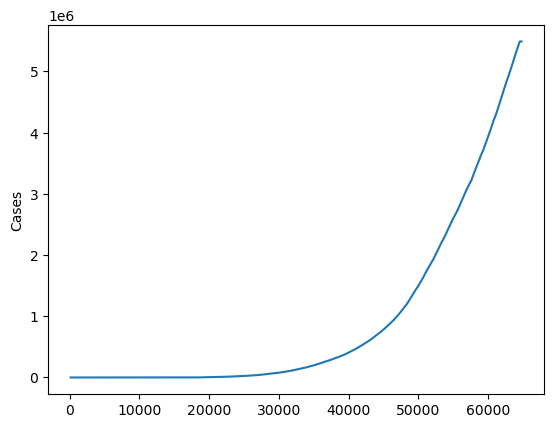

In [35]:
sns.lineplot(india_cases)  # create a lineplot for india_case

* Here we can see that the cases are increased slowely at first, but then increased rapidly.
* This suggests that the virus was spreading quickly and unchecked during this period.

<Axes: ylabel='Deaths'>

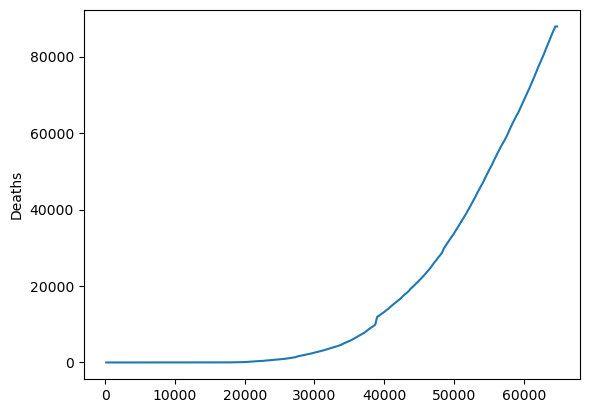

In [36]:
sns.lineplot(india_deaths)  # create a lineplot for india_deaths

* The curve exhibits exponential growth, indicating a rapid increase in the number of deaths over a relatively short period.

<Axes: ylabel='Recovers'>

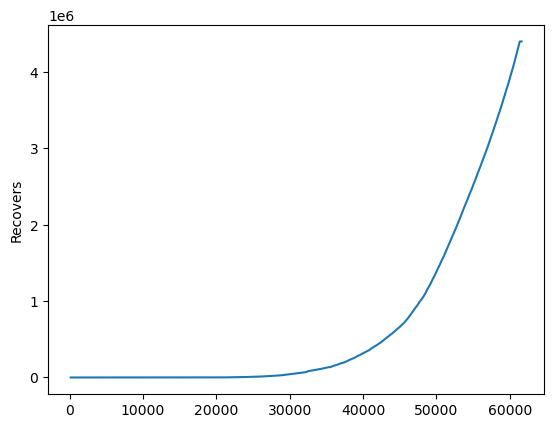

In [37]:
sns.lineplot(india_recovered)  # create a lineplot for india_recovered cases

* Here we can see that the number of recovered cases starts slowly but then rapidly increases.

### 2. Univariante Analysis :

<Axes: ylabel='Cases'>

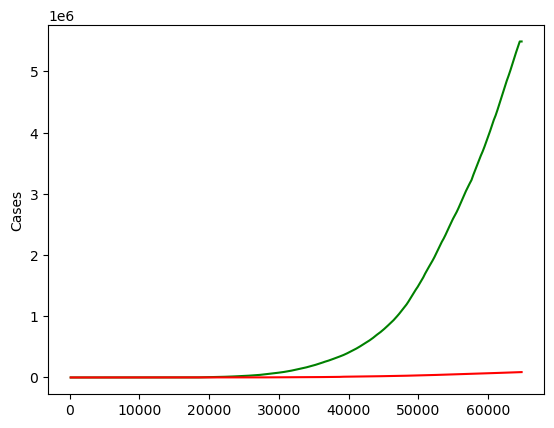

In [38]:
# create a lineplot
sns.lineplot(india_cases, color='green')
sns.lineplot(india_deaths, color='red')

* The green line, representing cases, shows a exponential growth pattern.
* The red line, representing deaths, relatively low compared to the number of cases.

<Axes: ylabel='Cases'>

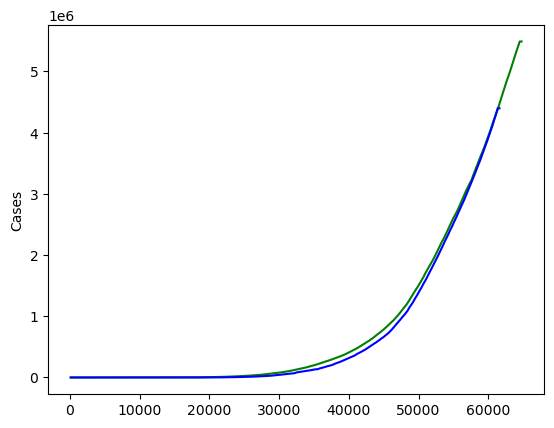

In [39]:
# create a lineplot
sns.lineplot(india_cases, color='green')
sns.lineplot(india_recovered, color='blue')

* The green line, representing cases, shows a exponential growth pattern.
* The blue line, representing recoverd cases, also increase but little low compared to the number of cases.

<Axes: ylabel='Recovers'>

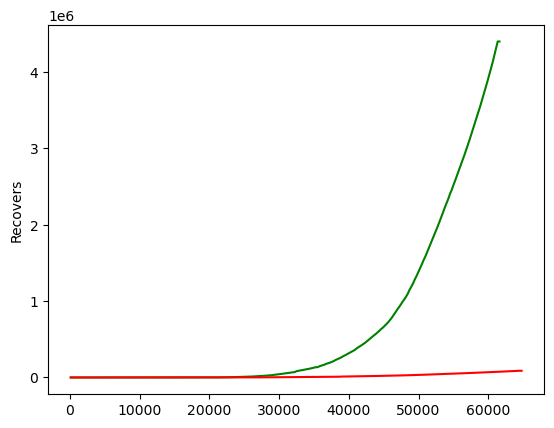

In [40]:
# create a lineplot 
sns.lineplot(india_recovered, color='green')
sns.lineplot(india_deaths, color='red')

* The green line, representing recovered cases, indicating a increase in the number of people recovering.
* The red line, representing deaths, increases little but at a much slower rate compared to recoveries.

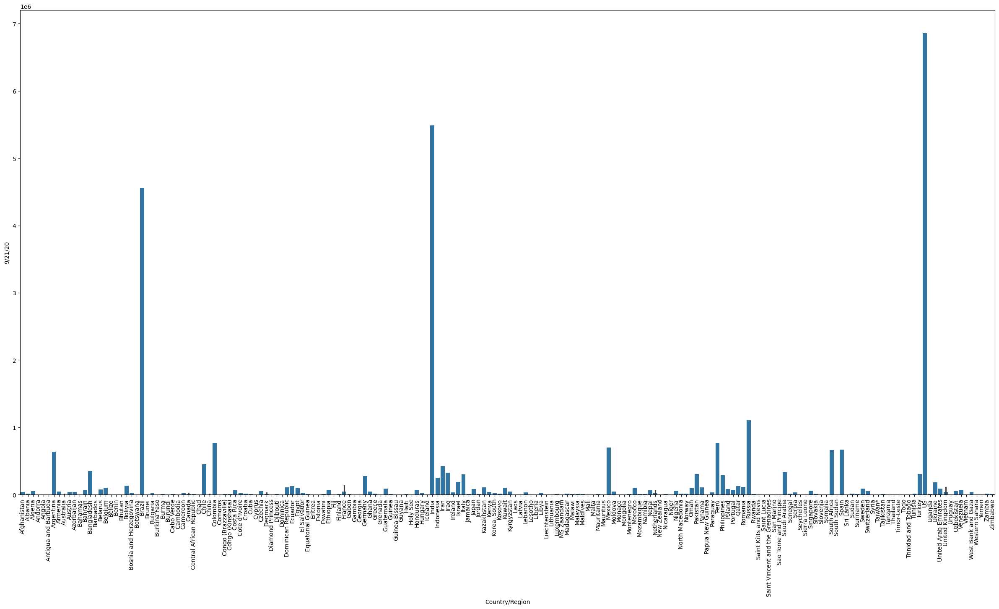

In [41]:
plt.figure(figsize=(30,15))
sns.barplot(x=confiremed_data['Country/Region'],y=confiremed_data['9/21/20'])
plt.xticks(rotation=90)
plt.show()

* Here we can see that the US country has the highest number of cases of Covid19 followed by India and Brazil.

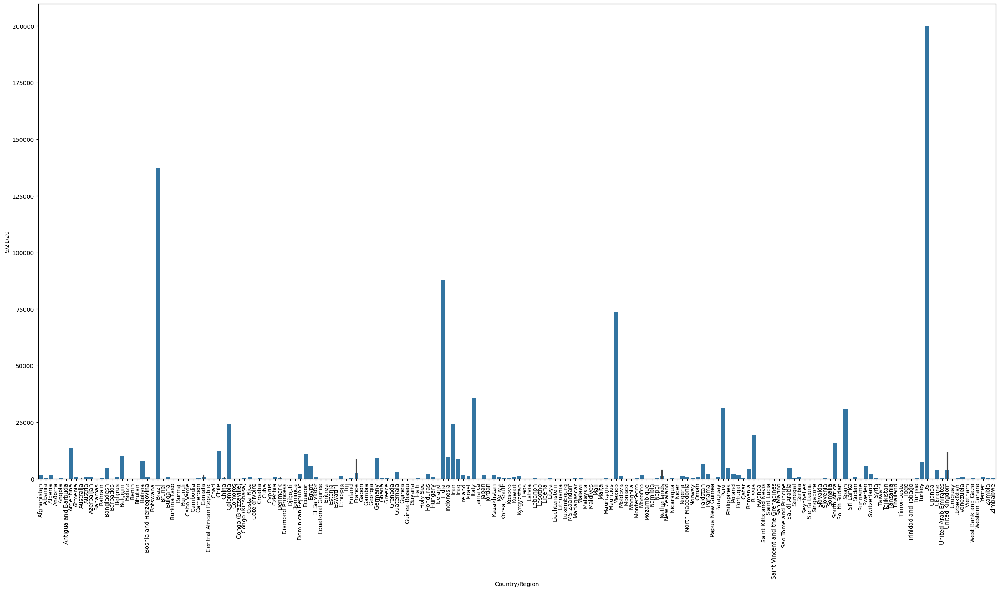

In [42]:
plt.figure(figsize=(30,15))
sns.barplot(x=death_data['Country/Region'],y=death_data['9/21/20'])
plt.xticks(rotation=90)
plt.show()

* Here we can see that the highest number of deaths due to covid19 has occurred in the US country. After this, Brazil, India and Mexixo have the highest number of deaths.

### 3. Multivariante Analysis :

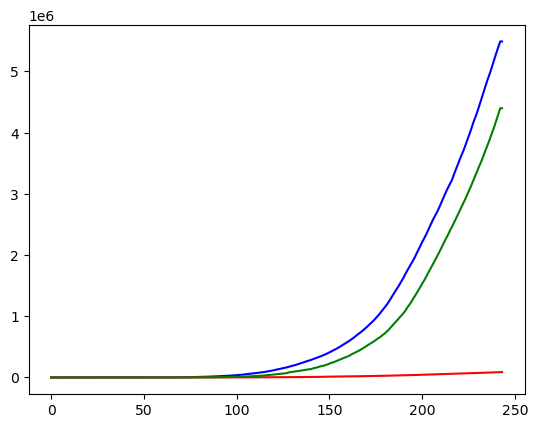

In [43]:
plt.plot(day,india_cases,color='blue')  # create a plot
plt.plot(day,india_deaths,color='red')  # create a plot
plt.plot(day,india_recovered,color='green')  # create a plot

* The blue line, representing confiremed cases, shows a exponential growth pattern.
* The green line, representing recovered cases, relatively low compared to the number of cases.
* The red line, representing deaths cases, increases little but at a much slower rate compared to recoveries.

### Feature Selection


**Feature Selection:-** It is the process of identifying and selecting a subset of relevant features (variables, predictors) from a larger set of available features in a dataset. The goal of feature selection is to improve the performance of machine learning models by retaining only the most important and informative features, while eliminating redundant or irrelevant ones.

We take the Day as independent variable and the Confirmed Cases, Death Cases and Recovered Cases of India as dependent variable. 


In [44]:
india_recovered = np.array(india_recovered).reshape(-1,1)  # Make and Reshape the recovered cases array to a column vector
india_cases = np.array(india_cases).reshape(-1,1)  # Make and Reshape the confiremed cases array to a column vector
india_deaths = np.array(india_deaths).reshape(-1,1)  # Make and Reshape death cases array to a column vector

In [57]:
# appling MinMaxscaler on the data
from sklearn.preprocessing import MinMaxScaler  # import MinMaxScaler
scaler = MinMaxScaler()  # craete an instance object
india_cases = scaler.fit_transform(india_cases)  # transform the data into 0 to 1 range
india_deaths = scaler.fit_transform(india_deaths)  # transform the data into 0 to 1 range
india_recovered = scaler.fit_transform(india_recovered)  # transform the data into 0 to 1 range

## Model Creation

In [58]:
## splitting the data into train and test
from sklearn.model_selection import train_test_split  # import train_test_split
x_train_cases,x_test_cases,y_train_cases,y_test_cases = train_test_split(day,india_cases,test_size=0.2, random_state=0)

In [59]:
# split the deaths cases into training and testing
x_train_deaths,x_test_deaths,y_train_deaths,y_test_deaths = train_test_split(day,india_deaths,test_size=0.2, random_state=0)

In [60]:
# appling polinomial features on confirmed cases of india
from sklearn.preprocessing import PolynomialFeatures   # import PolynomialFeatures                      
poly = PolynomialFeatures(degree=3)    # Create polynomial features up to the 3rd degree

# Transform the training and test data into polynomial features
poly_x_train_cases = poly.fit_transform(x_train_cases)           
poly_x_test_cases = poly.transform(x_test_cases)     

In [61]:
# appling polinomial features on deaths cases of india
poly = PolynomialFeatures(degree=3)  # Create polynomial features up to the 3rd degree

# Transform the training and test data into polynomial features
poly_x_train_deaths = poly.fit_transform(x_train_deaths)
poly_x_test_deaths = poly.transform(x_test_deaths)

Polynomial features are used to help the model capture non-linear relationships in the data, allowing it to fit more complex patterns in COVID-19 case trends.

## Model Selection 

### Linear Regression

**Fit the Confirmed cases of india**

In [62]:
from sklearn.linear_model import LinearRegression  # import LinearRegression
lr = LinearRegression()  # create an instance object
lr.fit(poly_x_train_cases,y_train_cases)  # train the model

LinearRegression()

In [63]:
lr_pred_cases = lr.predict(poly_x_test_cases)  # predict the testing data

## Model Evaluation

In covid19 dataset, the r2_score can be helpful as it provides a measure of how well the model explains the variance in the target variable.
MAE is used for interpretability, showing average absolute errors.
MSE penalize larger errors more heavily, which is useful for highlighting major deviations in predicted cases that may impact public health responses.

In [64]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error  # import Regression metrics

In [65]:
case_r2_1 = r2_score(y_test_cases,lr_pred_cases)  # check the model performance
case_r2_1

0.9985067839726861

In [66]:
case_mse1 = mean_squared_error(y_test_cases,lr_pred_cases)  # check the mean squared error
case_mse1

0.00011276982685836622

In [67]:
case_mae1 = mean_absolute_error(y_test_cases,lr_pred_cases) # check the mean absolute error
case_mae1

0.008600465832836465

Text(0, 0.5, 'Covid19 Cases')

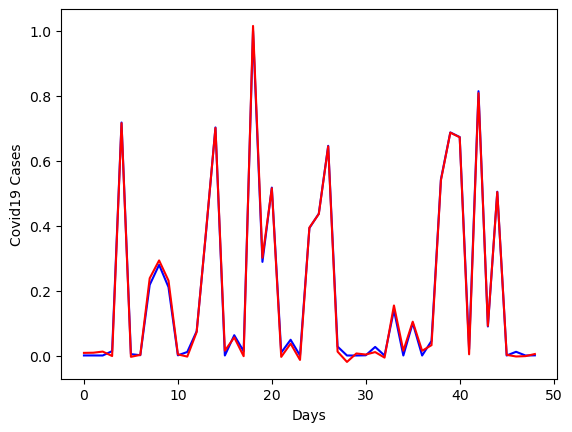

In [68]:
# plot the test and prediction data
plt.plot(y_test_cases, label='Original data',color='blue')
plt.plot(lr_pred_cases, label='Prediction',color='red')
plt.xlabel('Days')
plt.ylabel('Covid19 Cases')

In [69]:
train_pred = lr.predict(poly_x_train_cases)  # predict the training data

In [70]:
# print the training accuracy and testing accuracy
print('Traininig period :',r2_score(y_train_cases,train_pred))
print('Testing period :',r2_score(y_test_cases,lr_pred_cases))

Traininig period : 0.9980924174198093
Testing period : 0.9985067839726861


**Conclusion**
* Linear Regression model gives the generalize model for confiremed cases in india. It's testing r2_score is 0.99 and training r2_score is 0.99.
* It's means squared error is 0.00011 and mean absolute error is 0.0086.
* Linear Regression model not required the hyperparameter tuning.

#### **Fit the deaths cases of india**

In [71]:
lr.fit(poly_x_train_deaths, y_train_deaths)  # train the model
lr_pred_deaths = lr.predict(poly_x_test_deaths)  # predict the testing data

In [72]:
death_r2_1 = r2_score(y_test_deaths, lr_pred_deaths)  # check the model performance
death_r2_1

0.9991926803149959

In [73]:
death_mse1 = mean_squared_error(y_test_deaths, lr_pred_deaths) # check the mean squared error
death_mse1

7.205563339038304e-05

In [74]:
death_mae1 = mean_absolute_error(y_test_deaths, lr_pred_deaths) # check the mean absolute error
death_mae1

0.0059909943114541606

In [75]:
lr_train_deaths = lr.predict(poly_x_train_deaths)  # predict the training data

In [76]:
# print the training accuracy and testing accuracy
print('Traininig period :',r2_score(y_train_deaths,lr_train_deaths))
print('Testing period :',r2_score(y_test_deaths,lr_pred_deaths))

Traininig period : 0.9994267891629541
Testing period : 0.9991926803149959


Text(0, 0.5, 'Covid19 Deaths in India')

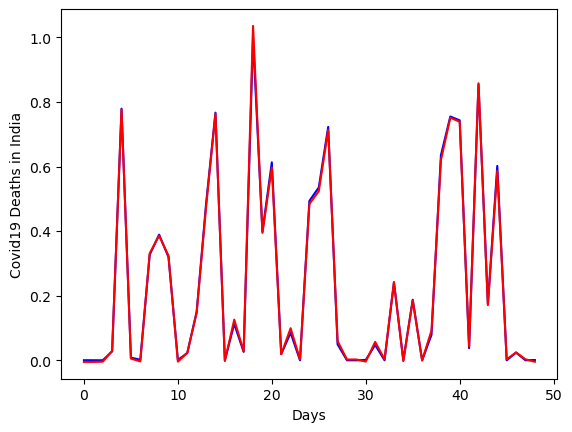

In [77]:
# plot the test and prediction data
plt.plot(y_test_deaths, label='Original data',color='blue')
plt.plot(lr_pred_deaths, label='Prediction',color='red')
plt.xlabel('Days')
plt.ylabel('Covid19 Deaths in India')

**Conclusion**
* Linear Regression model gives the generalize model for death cases in india. It's testing r2_score is 0.99 and training r2_score is 0.99.
* It's means squared error is 7.20 and mean absolute error is 0.0059.
* Linear Regression model not required the hyperparameter tuning.

### KNN Algorithm

#### **Fit the confiremed cases of india**

In [78]:
from sklearn.neighbors import KNeighborsRegressor  # import KNeighborsRegressor

In [79]:
knn = KNeighborsRegressor()  ## create an instance object
knn.fit(x_train_cases,y_train_cases)  # train the model

KNeighborsRegressor()

In [80]:
knn_pred_cases = knn.predict(x_test_cases)  # predict the testing data

In [81]:
case_r2_2 = r2_score(y_test_cases,knn_pred_cases)  # check the model performance
case_r2_2

0.9992058189884604

In [82]:
case_mse2 = mean_squared_error(y_test_cases,knn_pred_cases) # check the mean squared error
case_mse2

5.997769480590582e-05

In [83]:
case_mae2 = mean_absolute_error(y_test_cases,knn_pred_cases)  # check the mean absolute error
case_mae2

0.003410355005005369

In [84]:
knn_train_cases = knn.predict(x_train_cases)  # predict the training data

In [85]:
# print the training accuracy and testing accuracy
print('Traininig period :',r2_score(y_train_cases,knn_train_cases))
print('Testing period :',r2_score(y_test_cases,knn_pred_cases))

Traininig period : 0.9995698083019864
Testing period : 0.9992058189884604


Text(0, 0.5, 'Covid19 Cases in India')

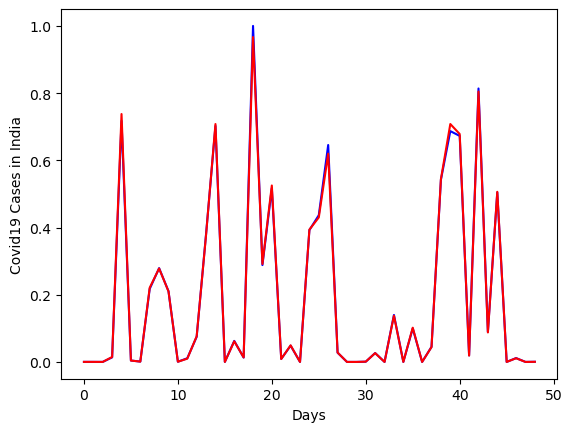

In [86]:
# plot the test and prediction data
plt.plot(y_test_cases, label='Original data',color='blue')
plt.plot(knn_pred_cases, label='Prediction',color='red')
plt.xlabel('Days')
plt.ylabel('Covid19 Cases in India')

**Conclusion**
* KNN model gives the generalize model for confiremed cases in india. It's testing r2_score is 0.99 and training r2_score is 0.99.
* It's means squared error is 5.99 and mean absolute error is 0.0034.
* KNN model not required the hyperparameter tuning.

#### **Fit the death cases of india**

In [87]:
knn.fit(x_train_deaths,y_train_deaths)  # train the model

KNeighborsRegressor()

In [88]:
knn_pred_deaths = knn.predict(x_test_deaths)  # predict the testing data

In [89]:
death_r2_2 = r2_score(y_test_deaths, knn_pred_deaths)  # check the model performance
death_r2_2

0.9995580927289852

In [90]:
death_mse2 = mean_squared_error(y_test_deaths, knn_pred_deaths)  # check the mean squared error
death_mse2

3.94415110943605e-05

In [91]:
death_mae2 = mean_absolute_error(y_test_deaths, knn_pred_deaths)  # check the mean absolute error
death_mae2

0.0031859975505188166

In [92]:
knn_train_deaths = knn.predict(x_train_deaths)  # predict the training data

In [93]:
# print the training accuracy and testing accuracy
print('Traininig period :',r2_score(y_train_deaths,knn_train_deaths))
print('Testing period :',r2_score(y_test_deaths,knn_pred_deaths))

Traininig period : 0.9997272604450093
Testing period : 0.9995580927289852


Text(0, 0.5, 'Covid19 Deaths in India')

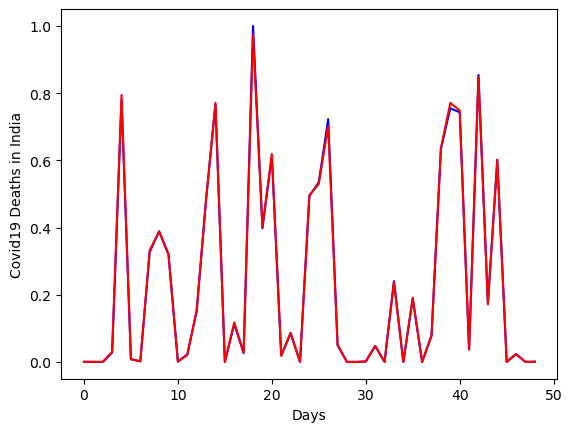

In [94]:
# plot the test and prediction data
plt.plot(y_test_deaths, label='Original data',color='blue')
plt.plot(knn_pred_deaths, label='Prediction',color='red')
plt.xlabel('Days')
plt.ylabel('Covid19 Deaths in India')

**Conclusion**
* KNN model gives the generalize model for death cases in india. It's testing r2_score is 0.99 and training r2_score is 0.99.
* It's means squared error is 3.94 and mean absolute error is 0.0031.
* KNN model not required the hyperparameter tuning.

### DecisionTree Algorithm

#### **Fit the confiremed cases of india**

In [95]:
from sklearn.tree import DecisionTreeRegressor  # import DecisionTreeRegressor
dt = DecisionTreeRegressor()  # create an instance object

In [96]:
dt.fit(x_train_cases,y_train_cases)  # train the model

DecisionTreeRegressor()

In [97]:
dt_pred_cases = dt.predict(x_test_cases) # predict the testing data

In [98]:
case_r2_3 = r2_score(y_test_cases , dt_pred_cases)  # check the model performance
case_r2_3

0.9989643182927191

In [99]:
case_mse3 = mean_squared_error(y_test_cases , dt_pred_cases) # check the mean squared error
case_mse3

7.821617547230322e-05

In [100]:
case_mae3 = mean_absolute_error(y_test_cases , dt_pred_cases)  # check the mean absolute error
case_mae3

0.005129762042983746

In [101]:
dt_train_cases = dt.predict(x_train_cases)  # predict the training data

In [102]:
# print the training accuracy and testing accuracy
print('Traininig period :',r2_score(y_train_cases,dt_train_cases))
print('Testing period :',r2_score(y_test_cases,dt_pred_cases))

Traininig period : 1.0
Testing period : 0.9989643182927191


Text(0, 0.5, 'Covid19 Cases in India')

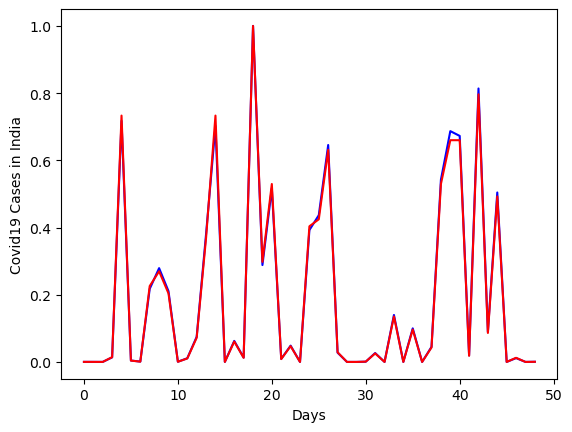

In [103]:
# plot the test and prediction data
plt.plot(y_test_cases, label='Original data',color='blue')
plt.plot(dt_pred_cases, label='Prediction',color='red')
plt.xlabel('Days')
plt.ylabel('Covid19 Cases in India')

**Conclusion**
* Decision Tree model gives the generalize model for confiremed cases in india. It's testing r2_score is 0.99 and training r2_score is 1.0.
* It's means squared error is 7.82 and mean absolute error is 0.0051.
* Decision Tree model not required the hyperparameter tuning.

#### **Fit the death cases of india**

In [104]:
dt.fit(x_train_deaths, y_train_deaths)  # train the model

DecisionTreeRegressor()

In [105]:
dt_pred_deaths = dt.predict(x_test_deaths)  # predict the testing data

In [106]:
death_r2_3 = r2_score(y_test_deaths, dt_pred_deaths) # check the model performance
death_r2_3

0.9993455731992898

In [107]:
death_mse3 = mean_squared_error(y_test_deaths, dt_pred_deaths)  # check the mean squared error
death_mse3

5.840949813154583e-05

In [108]:
death_mae3 = mean_absolute_error(y_test_deaths, dt_pred_deaths)  # check the mean absolute error
death_mae3

0.004858323475495202

In [109]:
dt_train_deaths = dt.predict(x_train_deaths)  # predict the training data

In [110]:
# print the training accuracy and testing accuracy
print('Traininig period :',r2_score(y_train_deaths,dt_train_deaths))
print('Testing period :',r2_score(y_test_deaths,dt_pred_deaths))

Traininig period : 1.0
Testing period : 0.9993455731992898


Text(0, 0.5, 'Covid19 Deaths in India')

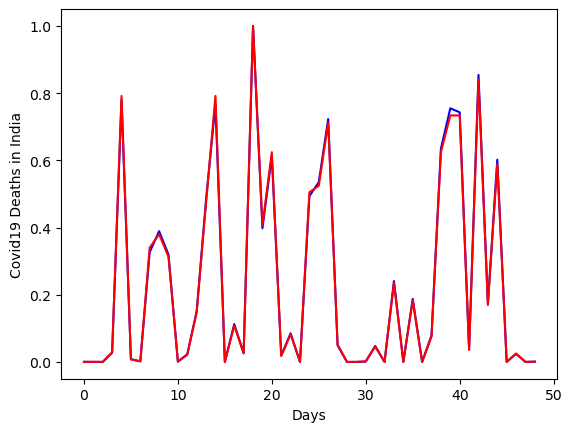

In [111]:
# plot the test and prediction data
plt.plot(y_test_deaths, label='Original data',color='blue')
plt.plot(dt_pred_deaths, label='Prediction',color='red')
plt.xlabel('Days')
plt.ylabel('Covid19 Deaths in India')

**Conclusion**
* Decision Tree model gives the generalize model for death cases in india. It's testing r2_score is 0.99 and training r2_score is 1.0.
* It's means squared error is 5.84 and mean absolute error is 0.0048.
* Decision Tree model not required the hyperparameter tuning.

### Bagging Algorithm

#### **Fit the confiremed cases of india**

In [112]:
from sklearn.ensemble import BaggingRegressor  # import BaggingRegressor
bg = BaggingRegressor(random_state=0)  # create an instance object

In [113]:
bg.fit(x_train_cases, y_train_cases)  # train the model

BaggingRegressor(random_state=0)

In [114]:
bg_pred_cases = bg.predict(x_test_cases)  # predict the testing data

In [115]:
case_r2_4 = r2_score(y_test_cases, bg_pred_cases)  # check the model performance
case_r2_4

0.9994642779631302

In [116]:
case_mse4 = mean_squared_error(y_test_cases, bg_pred_cases)  # check the mean squared error
case_mse4

4.0458500469417256e-05

In [117]:
case_mae4 = mean_absolute_error(y_test_cases, bg_pred_cases)  # check the mean absolute error
case_mae4

0.0035145327433653392

In [118]:
bg_train_cases = bg.predict(x_train_cases)  # predict the training data

In [119]:
# print the training accuracy and testing accuracy
print('Traininig period :',r2_score(y_train_cases,bg_train_cases))
print('Testing period :',r2_score(y_test_cases,bg_pred_cases))

Traininig period : 0.9999222496093516
Testing period : 0.9994642779631302


Text(0, 0.5, 'Covid19 Cases in India')

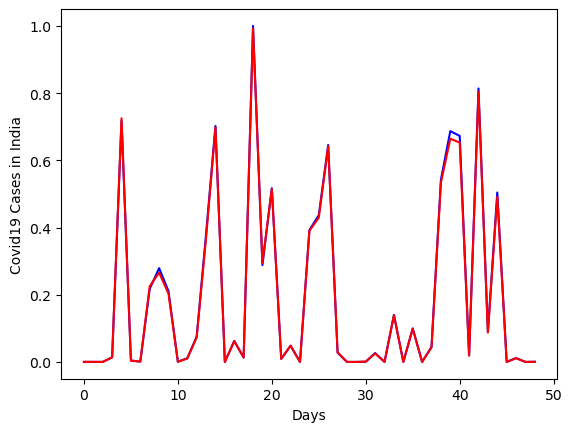

In [120]:
# plot the test and prediction data
plt.plot(y_test_cases, label='Original data',color='blue')
plt.plot(bg_pred_cases, label='Prediction',color='red')
plt.xlabel('Days')
plt.ylabel('Covid19 Cases in India')

**Conclusion**
* Bagging model gives the generalize model for confiremed cases in india. It's testing r2_score is 0.9994 and training r2_score is 0.9999.
* It's means squared error is 4.045 and mean absolute error is 0.0035.
* Bagging model not required the hyperparameter tuning.

#### **Fit the death cases of india**

In [121]:
bg.fit(x_train_deaths, y_train_deaths)  # train the model

BaggingRegressor(random_state=0)

In [122]:
bg_pred_deaths = bg.predict(x_test_deaths)  # predict the testing data

In [123]:
death_r2_4 = r2_score(y_test_deaths, bg_pred_deaths)  # check the model performance
death_r2_4

0.9996525405043216

In [124]:
death_mse4 = mean_squared_error(y_test_deaths, bg_pred_deaths)  # check the mean squared error
death_mse4

3.1011772044773596e-05

In [125]:
death_mae4 = mean_absolute_error(y_test_deaths, bg_pred_deaths)  # check the mean absolute error
death_mae4

0.0032826484864444724

In [126]:
bg_train_deaths = bg.predict(x_train_deaths)  # predict the training data

In [127]:
# print the training accuracy and testing accuracy
print('Traininig period :',r2_score(y_train_deaths,bg_train_deaths))
print('Testing period :',r2_score(y_test_deaths,bg_pred_deaths))

Traininig period : 0.9999492692208456
Testing period : 0.9996525405043216


Text(0, 0.5, 'Covid19 Deaths in India')

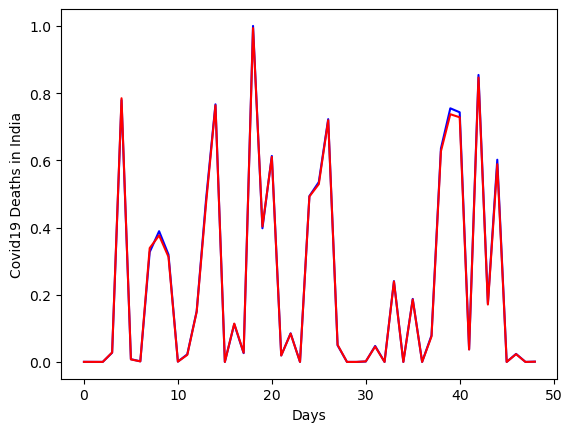

In [128]:
# plot the test and prediction data
plt.plot(y_test_deaths, label='Original data',color='blue')
plt.plot(bg_pred_deaths, label='Prediction',color='red')
plt.xlabel('Days')
plt.ylabel('Covid19 Deaths in India')

**Conclusion**
* Bagging model gives the generalize model for death cases in india. It's testing r2_score is 0.9996 and training r2_score is 0.9999.
* It's means squared error is 3.10 and mean absolute error is 0.0032.
* Bagging model not required the hyperparameter tuning.

### RandomForest Algorithm

#### **Fit the confiremed cases of india**

In [129]:
from sklearn.ensemble import RandomForestRegressor  # import RandomForestRegressor
rf = RandomForestRegressor(random_state=3)  # create an instance object

In [130]:
rf.fit(x_train_cases, y_train_cases)  # train the model

RandomForestRegressor(random_state=3)

In [131]:
rf_pred_cases = rf.predict(x_test_cases)  # predict the testing data

In [132]:
case_r2_5 = r2_score(y_test_cases, rf_pred_cases)  # check the model performance
case_r2_5

0.9995284281662169

In [133]:
case_mse5 = mean_squared_error(y_test_cases, rf_pred_cases)  # check the mean squared error
case_mse5

3.561378465958677e-05

In [134]:
case_mae5 = mean_absolute_error(y_test_cases, rf_pred_cases)  # check the mean absolute error
case_mae5

0.0031823920227725634

In [135]:
rf_train_cases = rf.predict(x_train_cases)  # predict the training data

In [136]:
# print the training accuracy and testing accuracy
print('Traininig period :',r2_score(y_train_cases,rf_train_cases))
print('Testing period :',r2_score(y_test_cases,rf_pred_cases))

Traininig period : 0.9999480362073834
Testing period : 0.9995284281662169


Text(0, 0.5, 'Covid19 Cases in India')

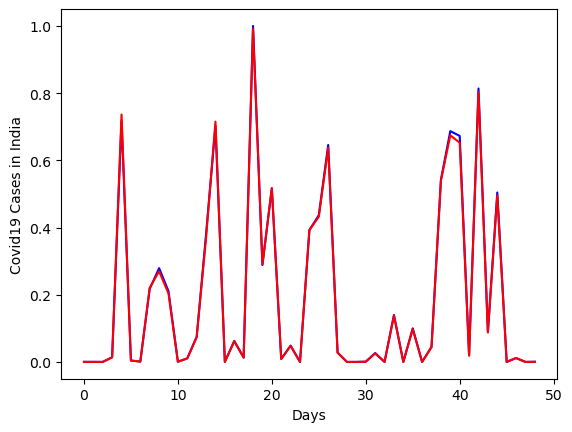

In [137]:
# plot the test and prediction data
plt.plot(y_test_cases, label='Original data',color='blue')
plt.plot(rf_pred_cases, label='Prediction',color='red')
plt.xlabel('Days')
plt.ylabel('Covid19 Cases in India')

**Conclusion**
* Random Forest model gives the generalize model for confiremed cases in india. It's testing r2_score is 0.9995 and training r2_score is 0.9999.
* It's means squared error is 3.56 and mean absolute error is 0.0031.
* Random Forest model not required the hyperparameter tuning.

#### **Fit the death cases of india**

In [138]:
rf.fit(x_train_deaths, y_train_deaths)  # train the model

RandomForestRegressor(random_state=3)

In [139]:
rf_pred_deaths = rf.predict(x_test_deaths)  # predict the testing data

In [140]:
death_r2_5 = r2_score(y_test_deaths, rf_pred_deaths)  # check the model performance
death_r2_5

0.9997186212226662

In [141]:
death_mse5 = mean_squared_error(y_test_deaths, rf_pred_deaths)  # check the mean squared error
death_mse5

2.511387545727459e-05

In [142]:
death_mae5 = mean_absolute_error(y_test_deaths, rf_pred_deaths)  # check the mean absolute error
death_mae5

0.00299956945979058

In [143]:
rf_train_deaths = rf.predict(x_train_deaths)  # predict the training data

In [144]:
# print the training accuracy and testing accuracy
print('Traininig period :',r2_score(y_train_deaths,rf_train_deaths))
print('Testing period :',r2_score(y_test_deaths,rf_pred_deaths))

Traininig period : 0.9999660792917308
Testing period : 0.9997186212226662


Text(0, 0.5, 'Covid19 Deaths in India')

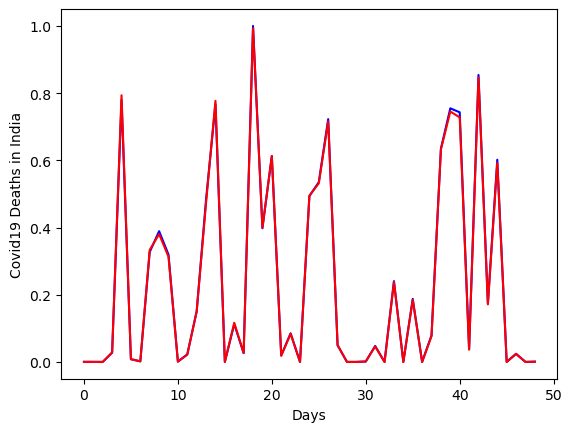

In [145]:
# plot the test and prediction data
plt.plot(y_test_deaths, label='Original data',color='blue')
plt.plot(rf_pred_deaths, label='Prediction',color='red')
plt.xlabel('Days')
plt.ylabel('Covid19 Deaths in India')

**Conclusion**
* Random Forest model gives the generalize model for death cases in india. It's testing r2_score is 0.9997 and training r2_score is 0.9999.
* It's means squared error is 2.51 and mean absolute error is 0.00299.
* Random Forest model not required the hyperparameter tuning.

### Gradient Boosting Algorithm

#### **Fit the confiremed cases of india**

In [146]:
from sklearn.ensemble import GradientBoostingRegressor  # import GradientBoostingRegressor
gb = GradientBoostingRegressor(random_state=0)  # create an instance object

In [147]:
gb.fit(x_train_cases, y_train_cases)  # train the model

GradientBoostingRegressor(random_state=0)

In [148]:
gb_pred_cases = gb.predict(x_test_cases)  # predict the testing data
case_r2_6 = r2_score(y_test_cases,gb_pred_cases)  # check the model performance
case_r2_6

0.9989714406789238

In [149]:
case_mse6 = mean_squared_error(y_test_cases,gb_pred_cases)  # check the mean squared error
case_mse6

7.767828259917744e-05

In [150]:
case_mae6 = mean_absolute_error(y_test_cases,gb_pred_cases)  # check the mean absolute error
case_mae6

0.005024756664266101

In [151]:
gb_train_cases = gb.predict(x_train_cases)  # predict the training data
# print the training accuracy and testing accuracy
print('Traininig period :',r2_score(y_train_cases,gb_train_cases))
print('Testing period :',r2_score(y_test_cases,gb_pred_cases))

Traininig period : 0.999996072164936
Testing period : 0.9989714406789238


Text(0, 0.5, 'Covid19 Cases in India')

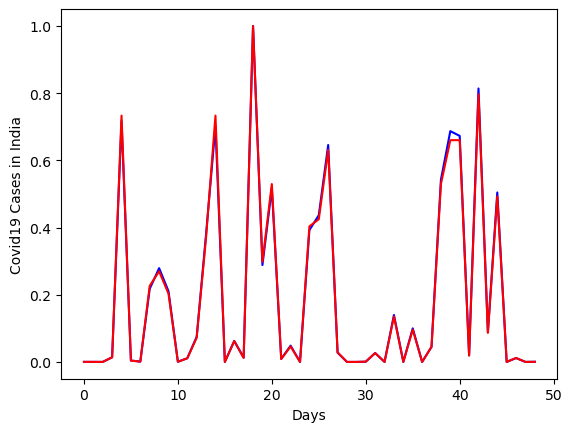

In [152]:
# plot the test and prediction data
plt.plot(y_test_cases, label='Original data',color='blue')
plt.plot(gb_pred_cases, label='Prediction',color='red')
plt.xlabel('Days')
plt.ylabel('Covid19 Cases in India')

**Conclusion**
* Gradient Boosting model gives the generalize model for confiremed cases in india. It's testing r2_score is 0.9989 and training r2_score is 0.9999.
* It's means squared error is 7.76 and mean absolute error is 0.0050.
* Gradient Boosting model not required the hyperparameter tuning.

#### **Fit the death cases of india**

In [153]:
gb.fit(x_train_deaths,y_train_deaths)  # train the model

GradientBoostingRegressor(random_state=0)

In [154]:
gb_pred_deaths = gb.predict(x_test_deaths)  # predict the testing data
death_r2_6 = r2_score(y_test_deaths, gb_pred_deaths)  # check the model performance
death_r2_6

0.9993726089627928

In [155]:
death_mse6 = mean_squared_error(y_test_deaths, gb_pred_deaths) # check the mean squared error
death_mse6

5.5996477491050555e-05

In [156]:
death_mae6 = mean_absolute_error(y_test_deaths, gb_pred_deaths)  # check the mean absolute error
death_mae6

0.004743697334737308

In [157]:
gb_train_deaths = gb.predict(x_train_deaths)  # predict the training data

# print the training accuracy and testing accuracy
print('Traininig period :',r2_score(y_train_deaths,gb_train_deaths))
print('Testing period :',r2_score(y_test_deaths,gb_pred_deaths))

Traininig period : 0.9999942000251241
Testing period : 0.9993726089627928


Text(0, 0.5, 'Covid19 Deaths in India')

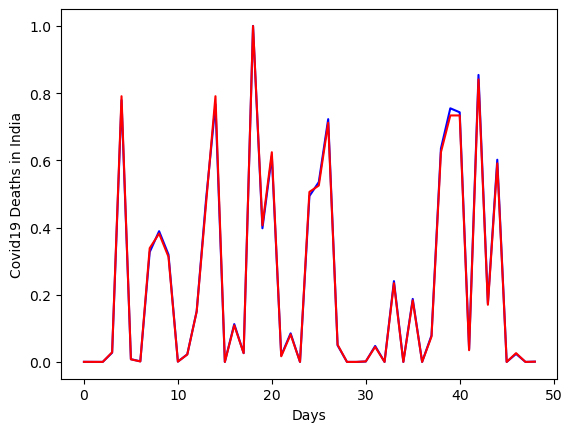

In [158]:
# plot the test and prediction data
plt.plot(y_test_deaths, label='Original data',color='blue')
plt.plot(gb_pred_deaths, label='Prediction',color='red')
plt.xlabel('Days')
plt.ylabel('Covid19 Deaths in India')

**Conclusion**
* Gradient Boosting model gives the generalize model for death cases in india. It's testing r2_score is 0.9993 and training r2_score is 0.9999.
* It's means squared error is 5.59 and mean absolute error is 0.0047.
* Gradient Boosting model not required the hyperparameter tuning.

### eXtreme Grediant Boosting 

#### **Fit the confiremed cases of india**

In [159]:
from xgboost import XGBRegressor  # import XGBRegressor
xgb = XGBRegressor()  # create an instance object

In [160]:
xgb.fit(x_train_cases, y_train_cases)  # train the model

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [161]:
xgb_pred_cases = xgb.predict(x_test_cases)  # predict the testing data
case_r2_7 = r2_score(y_test_cases, xgb_pred_cases)  # check the model performance
case_r2_7

0.9977420735898863

In [162]:
case_mse7 = mean_squared_error(y_test_cases, xgb_pred_cases) # check the mean squared error
case_mse7

0.00017052185729983044

In [163]:
case_mae7 = mean_absolute_error(y_test_cases, xgb_pred_cases) # check the mean absolute error
case_mae7

0.006938792941607243

In [164]:
xgb_train_cases = xgb.predict(x_train_cases)  # predict the training data

# print the training accuracy and testing accuracy
print('Traininig period :',r2_score(y_train_cases,xgb_train_cases))
print('Testing period :',r2_score(y_test_cases,xgb_pred_cases))

Traininig period : 0.9999828944432303
Testing period : 0.9977420735898863


Text(0, 0.5, 'Covid19 Cases in India')

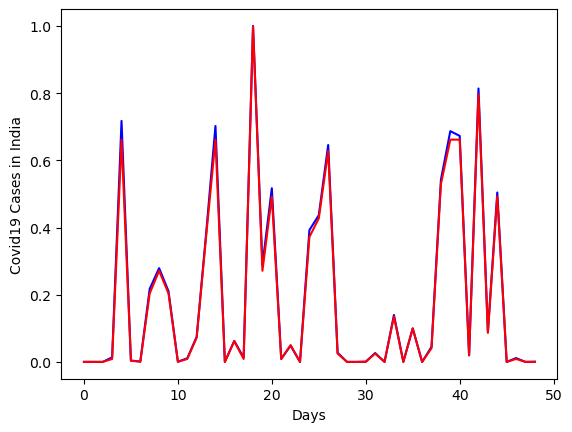

In [165]:
# plot the test and prediction data
plt.plot(y_test_cases, label='Original data',color='blue')
plt.plot(xgb_pred_cases, label='Prediction',color='red')
plt.xlabel('Days')
plt.ylabel('Covid19 Cases in India')

**Conclusion**
* XGB model gives the generalize model for confiremed cases in india. It's testing r2_score is 0.9977 and training r2_score is 0.9999.
* It's means squared error is 0.00017 and mean absolute error is 0.0069.
* XGB model not required the hyperparameter tuning.

#### **Fit the death cases of india**

In [166]:
xgb.fit(x_train_deaths, y_train_deaths)  # train the model

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [167]:
xgb_pred_deaths = xgb.predict(x_test_deaths)  # predict the testing data
death_r2_7 = r2_score(y_test_deaths, xgb_pred_deaths)  # check the model performance
death_r2_7

0.9986308891168939

In [168]:
death_mse7 = mean_squared_error(y_test_deaths, xgb_pred_deaths)  # check the mean squared error
death_mse7

0.0001221971341667172

In [169]:
death_mae7 = mean_absolute_error(y_test_deaths, xgb_pred_deaths)  # check the mean absolute error
death_mae7

0.006500003313446834

In [170]:
xgb_train_deaths = xgb.predict(x_train_deaths)  # predict the training data

# print the training accuracy and testing accuracy
print('Traininig period :',r2_score(y_train_deaths,xgb_train_deaths))
print('Testing period :',r2_score(y_test_deaths,xgb_pred_deaths))

Traininig period : 0.9999802374833758
Testing period : 0.9986308891168939


Text(0, 0.5, 'Covid19 Deaths in India')

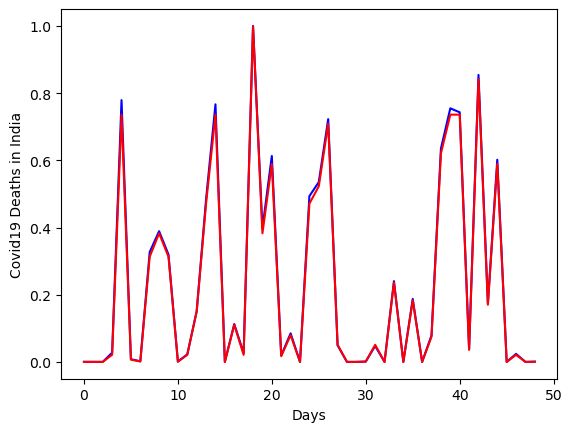

In [171]:
# plot the test and prediction data
plt.plot(y_test_deaths, label='Original data',color='blue')
plt.plot(xgb_pred_deaths, label='Prediction',color='red')
plt.xlabel('Days')
plt.ylabel('Covid19 Deaths in India')

**Conclusion**
* XGB model gives the generalize model for death cases in india. It's testing r2_score is 0.9986 and training r2_score is 0.9999.
* It's means squared error is 0.00012 and mean absolute error is 0.0065.
* XGB model not required the hyperparameter tuning.

## Time Series

A time series model predicts future values based on past data points over time, capturing trends, seasonality, and patterns in sequential data like daily COVID-19 cases.
* There are four model in time series:
   1. Auto Regression
   2. Moving Average
   3. ARMA
   4. ARIMA 

### AR (Auto Regression) :

#### **Fit the confiremed cases of india**

In [172]:
# assign the date and Cases of india
data = confirmed_case.loc[confirmed_case['Country/Region']=='India'][['Date','Cases']]
data

,Date,Cases
143,2020-01-22,0
409,2020-01-23,0
675,2020-01-24,0
941,2020-01-25,0
1207,2020-01-26,0
...,...,...
63717,2020-09-17,5214677
63983,2020-09-18,5308014
64249,2020-09-19,5400619
64515,2020-09-20,5487580


In [173]:
data.info()  # getting the information about the data

<class 'pandas.core.frame.DataFrame'>
Index: 244 entries, 143 to 64781
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    244 non-null    datetime64[ns]
 1   Cases   244 non-null    int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 5.7 KB


In [174]:
data = data.set_index('Date')  # set the Date as index
data

,Cases
Date,
2020-01-22,0
2020-01-23,0
2020-01-24,0
2020-01-25,0
2020-01-26,0
...,...
2020-09-17,5214677
2020-09-18,5308014
2020-09-19,5400619


In [175]:
data.describe()  # getting statistical information of the data

,Cases
count,2.440000e+02
mean,9.338968e+05
std,1.466931e+06
min,0.000000e+00
25%,4.732500e+02
50%,1.281085e+05
75%,1.251126e+06
max,5.487580e+06


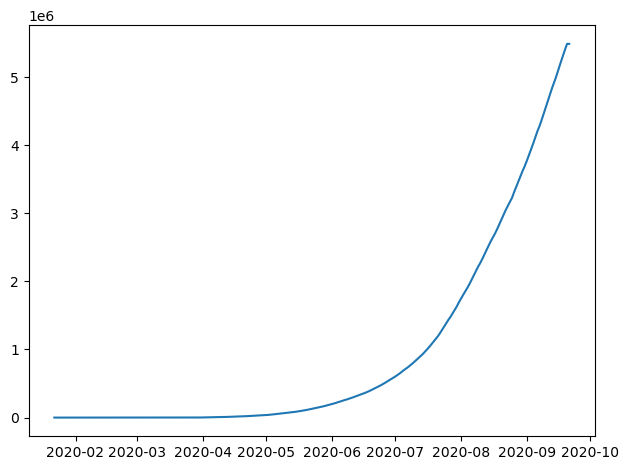

In [176]:
plt.plot(data)#line plot
plt.tight_layout()
## from plot we can see the series given is not stationary

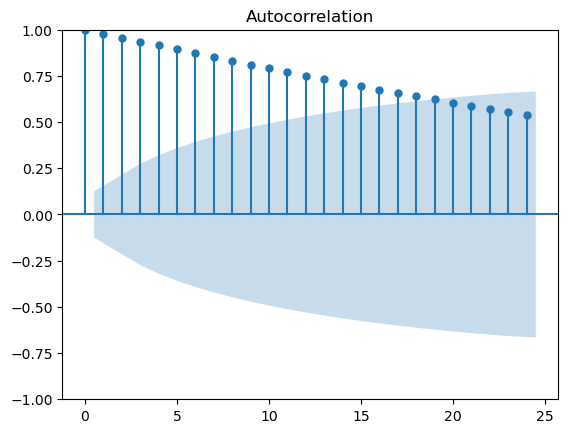

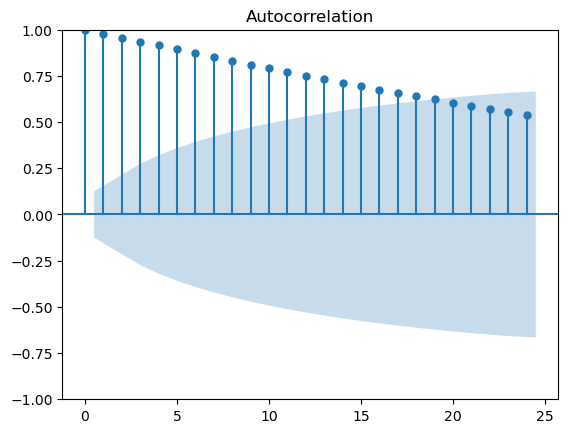

In [177]:
# Plotting the auto correlation factor plot
from statsmodels.graphics.tsaplots import plot_acf  # import plot_acf
plot_acf(data)

From the autocorrelation factor plot, it is clear that given series is not stationary.

We can perform ADFuller test, a test based on hypothesis, where if the p-value is less than 0.05, then we can consider the time series is stationary, and if the p-value is greater than 0.05, then the time series is non-stationary.

In [178]:
# ADfuller Test to check stationarity

from statsmodels.tsa.stattools import adfuller
dftest = adfuller(data.Cases, autolag='AIC')  # Akaike Information Criterion
print("1. ADF :",dftest[0])
print("2. P-value :",dftest[1])
print("3. Num of lags :",dftest[2])
print("4. Num Of Observations Used For ADF Regression and Critical Values Calculation :",dftest[3])
print("5. Critical Value (alpha) :")
for key,value in dftest[4].items():
    print("\t",key,':',value)

1. ADF : -2.306830176022356
2. P-value : 0.16977456577419886
3. Num of lags : 15
4. Num Of Observations Used For ADF Regression and Critical Values Calculation : 228
5. Critical Value (alpha) :
	 1% : -3.4593607492757554
	 5% : -2.8743015807562924
	 10% : -2.5735714042782396


The results suggest that the time series data (e.g., data.Passengers) is likely non-stationary. You might need to apply differencing or other transformations to make the series stationary before proceeding with further time series analysis or modeling.

In [179]:
## making it stationary by taking difference of 1
data1=data.diff(periods=1) #This means calculating the change in your row(s)/column(s) over a set number of periods. Or simply,
#pandas diff will subtract 1 cell value from another cell value within the same index.

In [180]:
data1 # integreted order of 1

,Cases
Date,
2020-01-22,NaN
2020-01-23,0.0
2020-01-24,0.0
2020-01-25,0.0
2020-01-26,0.0
...,...
2020-09-17,96424.0
2020-09-18,93337.0
2020-09-19,92605.0


In [181]:
data1 = data1.iloc[1:,:]  # null value discarded
data1

,Cases
Date,
2020-01-23,0.0
2020-01-24,0.0
2020-01-25,0.0
2020-01-26,0.0
2020-01-27,0.0
...,...
2020-09-17,96424.0
2020-09-18,93337.0
2020-09-19,92605.0


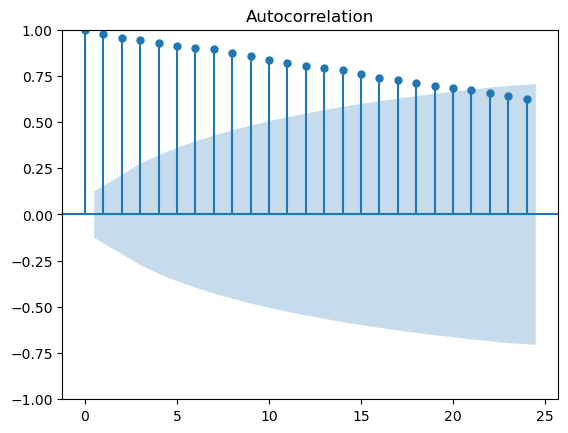

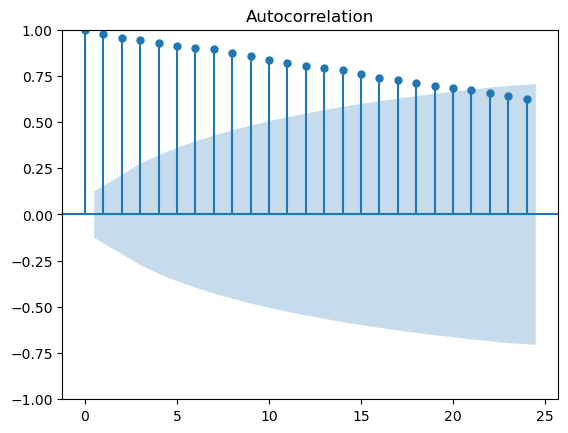

In [182]:
plot_acf(data1)  # autocorrelation plot 

In [183]:
data2 = data1.diff(periods=3) # differencing applied to data1
data2 = data2.iloc[3:,:]  # null value discarded
data2 # integreted order of 2

,Cases
Date,
2020-01-26,0.0
2020-01-27,0.0
2020-01-28,0.0
2020-01-29,0.0
2020-01-30,1.0
...,...
2020-09-17,12615.0
2020-09-18,3214.0
2020-09-19,-5289.0


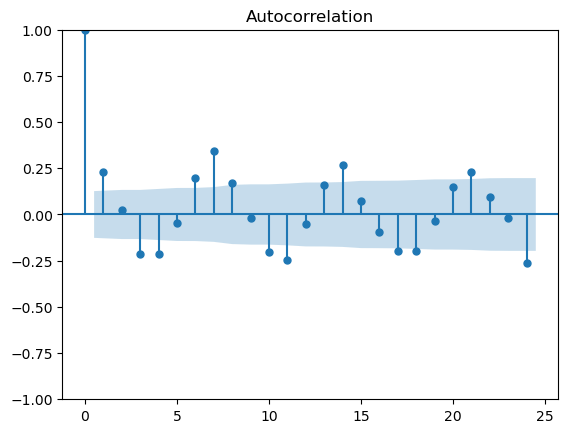

In [184]:
plot_acf(data2); # autocorrelation plot 

In [185]:
# integreted order of 3
data3 = data2.diff(periods=3)  # differencing applied to data2
data3 = data3.iloc[3:,:]  # null value discarded

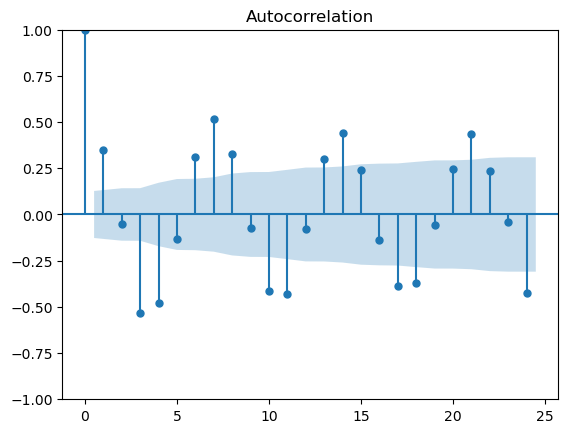

In [186]:
plot_acf(data3); # autocorrelation plot 

In [187]:
# integreted order of 4
data4 = data3.diff(periods=3)  # differencing applied to data3
data4 = data4.iloc[3:,:]  # null value discarded

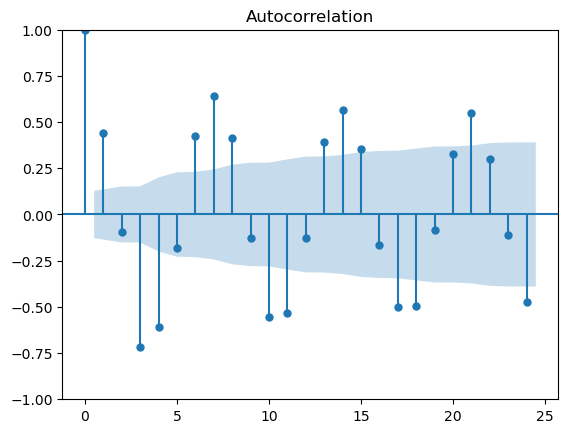

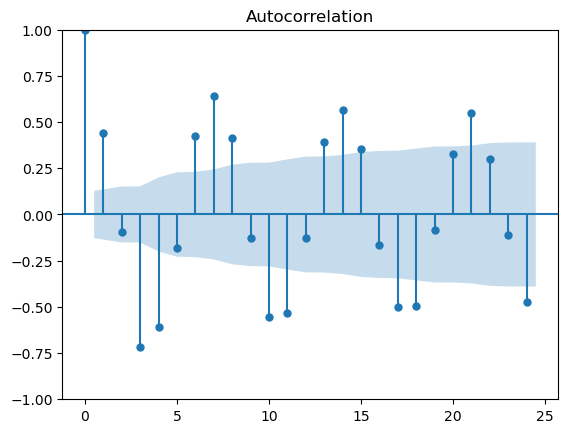

In [188]:
plot_acf(data4)  # autocorrelation plot 

In [189]:
# integreted order of 5
data5 =data4.diff(periods=3) # differencing applied to data4
data5 = data5.iloc[3:,:]  # null value discarded

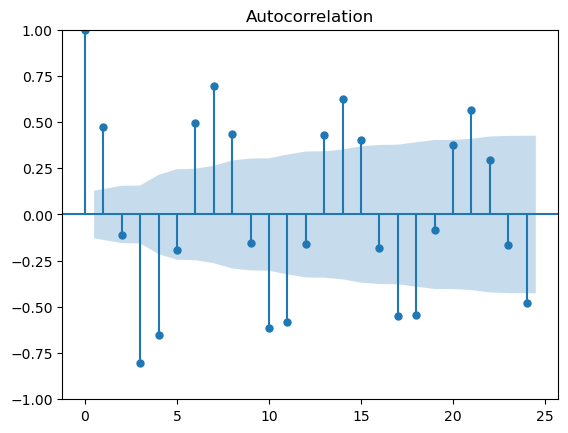

In [190]:
plot_acf(data5); # autocorrelation plot 

In [191]:
data6 = data5.diff(periods=3)  # differencing applied to data5
data6 = data6.iloc[3:,:]   # null value discarded
data6  # integreted order of 6

,Cases
Date,
2020-02-07,0.0
2020-02-08,0.0
2020-02-09,10.0
2020-02-10,0.0
2020-02-11,-5.0
...,...
2020-09-17,125296.0
2020-09-18,-239.0
2020-09-19,-149052.0


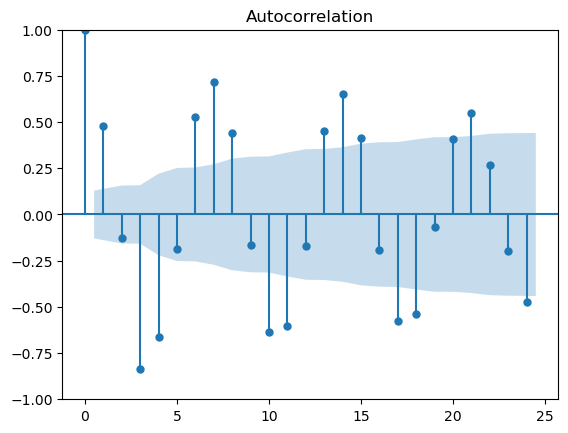

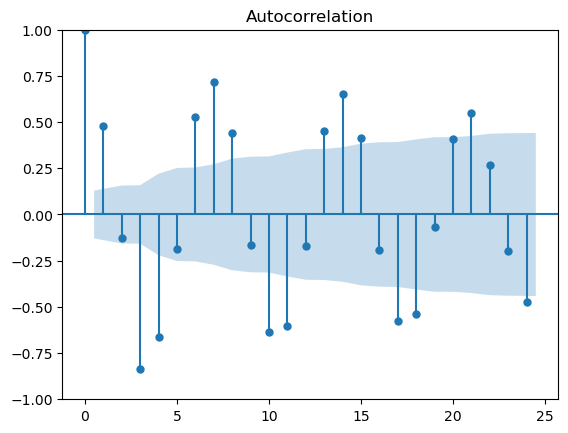

In [192]:
plot_acf(data6)  # autocorrelation plot 

In [193]:
data7 = data6.diff(periods=3)  # differencing applied to data6
data7 = data7.iloc[3:,:]  # null value discarded
data7  # integreted order of 7

,Cases
Date,
2020-02-10,0.0
2020-02-11,-5.0
2020-02-12,-20.0
2020-02-13,0.0
2020-02-14,9.0
...,...
2020-09-17,197694.0
2020-09-18,-14616.0
2020-09-19,-347814.0


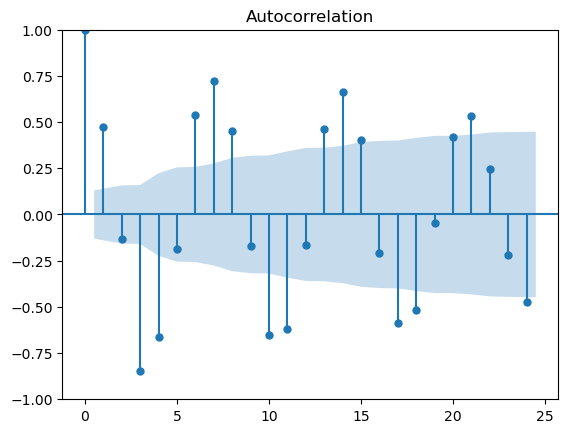

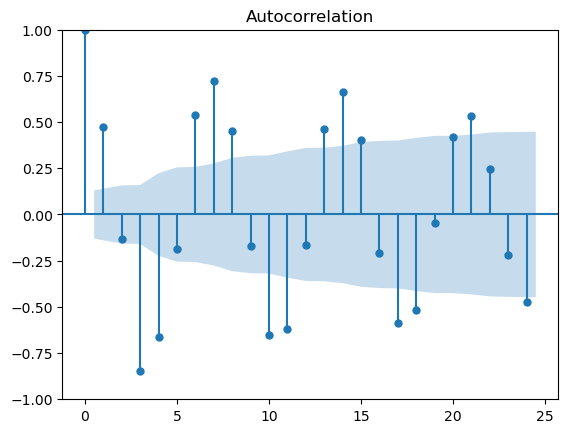

In [194]:
plot_acf(data7) # autocorrelation plot 

In [195]:
data8 = data7.diff(periods=3)  # differencing applied to data7
data8 = data8.iloc[3:,:]  # null value discarded
data8  # integreted order of 8

,Cases
Date,
2020-02-13,0.0
2020-02-14,14.0
2020-02-15,35.0
2020-02-16,0.0
2020-02-17,-14.0
...,...
2020-09-17,301916.0
2020-09-18,-65553.0
2020-09-19,-730466.0


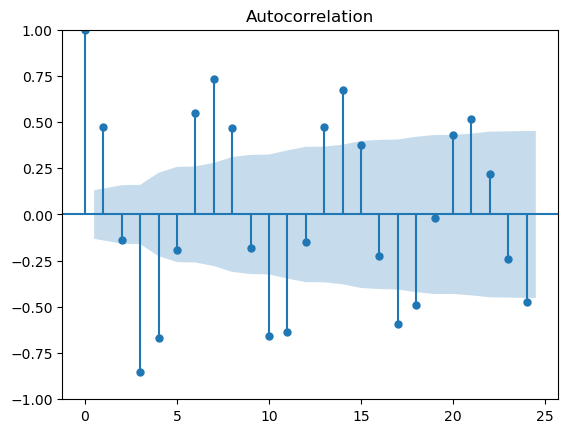

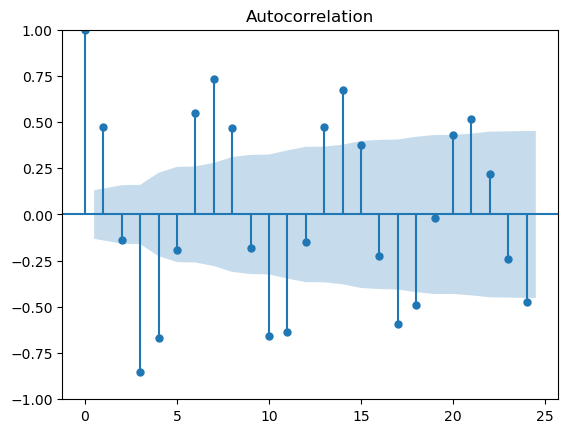

In [196]:
plot_acf(data8)  # autocorrelation plot 

In [197]:
data9 = data8.diff(periods=3)  # differencing applied to data8
data9 = data9.iloc[3:,:]  # null value discarded
data9  # integreted order of 9

,Cases
Date,
2020-02-16,0.0
2020-02-17,-28.0
2020-02-18,-56.0
2020-02-19,0.0
2020-02-20,20.0
...,...
2020-09-17,422351.0
2020-09-18,-254111.0
2020-09-19,-1403382.0


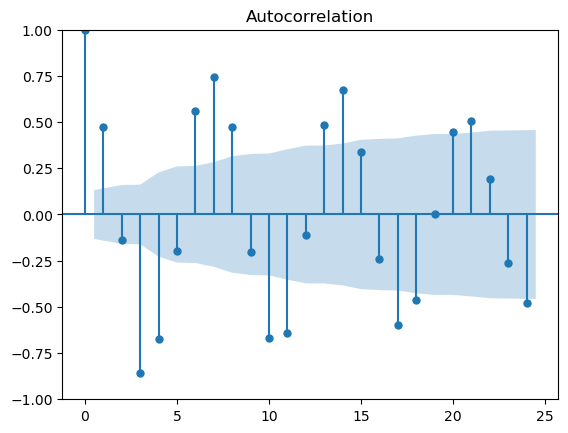

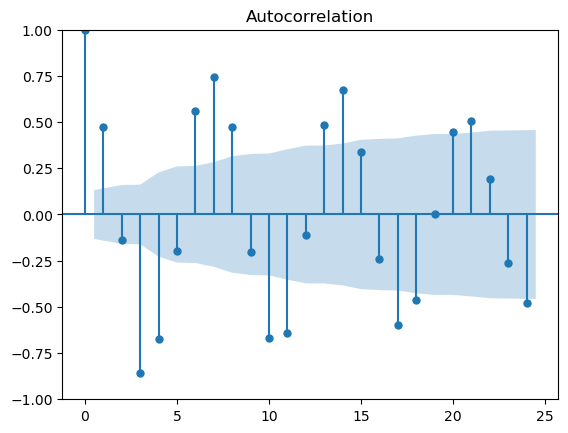

In [198]:
plot_acf(data9)  # autocorrelation plot 

In [199]:
data10 = data9.diff(periods=3)  # differencing applied to data9
data10 = data10.iloc[3:,:]  # null value discarded
data10  # integreted order of 10

,Cases
Date,
2020-02-19,0.0
2020-02-20,48.0
2020-02-21,84.0
2020-02-22,0.0
2020-02-23,-27.0
...,...
2020-09-17,462064.0
2020-09-18,-855883.0
2020-09-19,-2466300.0


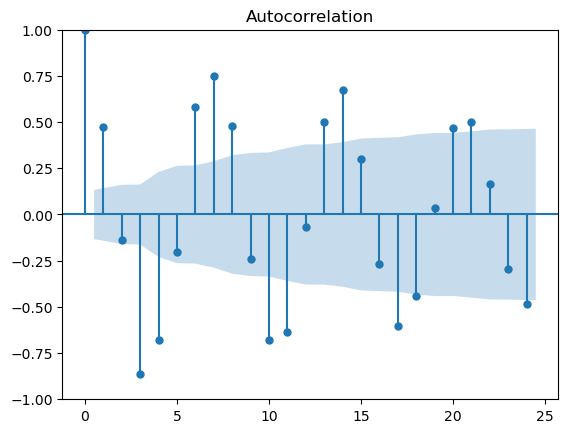

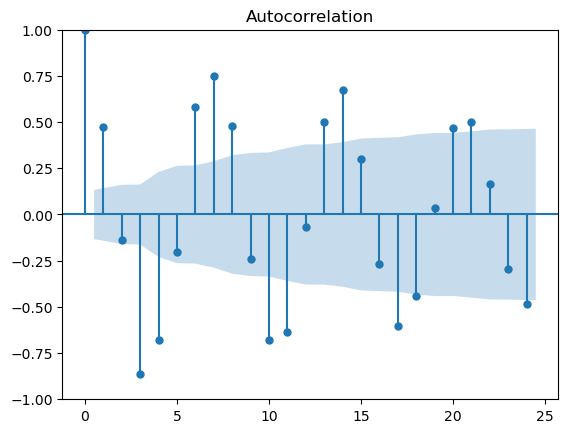

In [200]:
plot_acf(data10)   # autocorrelation plot 

In [201]:
data11 = data10.diff(periods=3) # differencing applied to data10
data11 = data11.iloc[3:,:]  # null value discarded
data11  # integreted order of 11

,Cases
Date,
2020-02-22,0.0
2020-02-23,-75.0
2020-02-24,-120.0
2020-02-25,0.0
2020-02-26,35.0
...,...
2020-09-17,103755.0
2020-09-18,-2523733.0
2020-09-19,-3875849.0


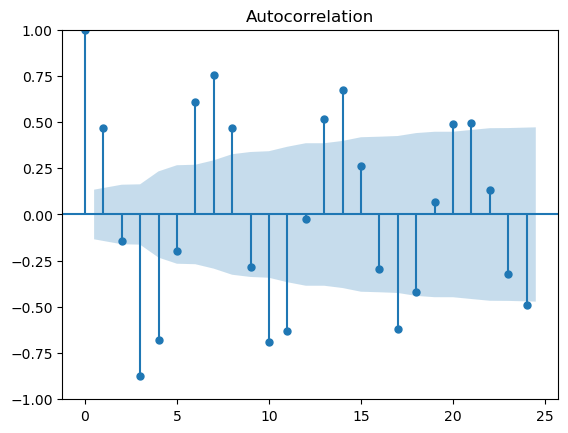

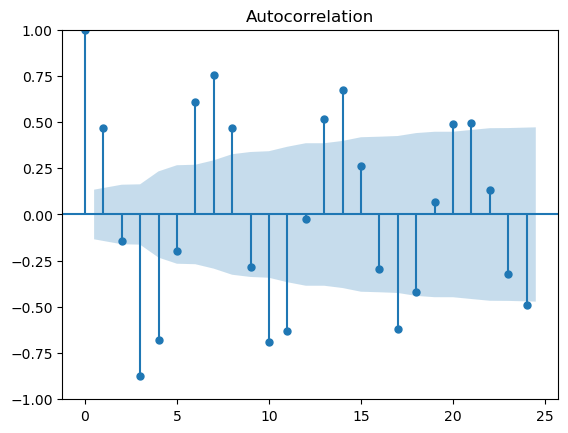

In [202]:
plot_acf(data11)  # autocorrelation plot 

In [203]:
data12 = data11.diff(periods=3)  # differencing applied to data11
data12 = data12.iloc[3:,:]  # null value discarded
data12  # integreted order of 12

,Cases
Date,
2020-02-25,0.0
2020-02-26,110.0
2020-02-27,165.0
2020-02-28,0.0
2020-02-29,-44.0
...,...
2020-09-17,-1467280.0
2020-09-18,-6632475.0
2020-09-19,-5092252.0


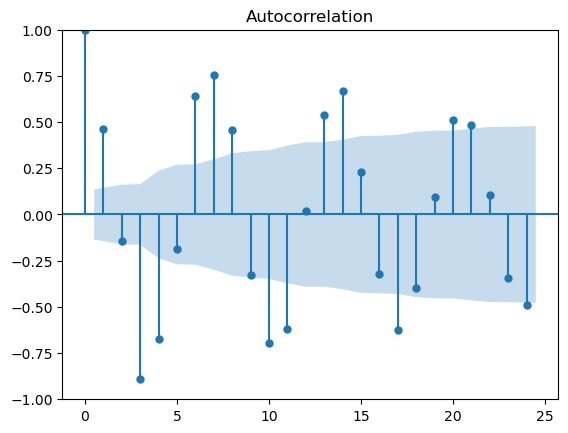

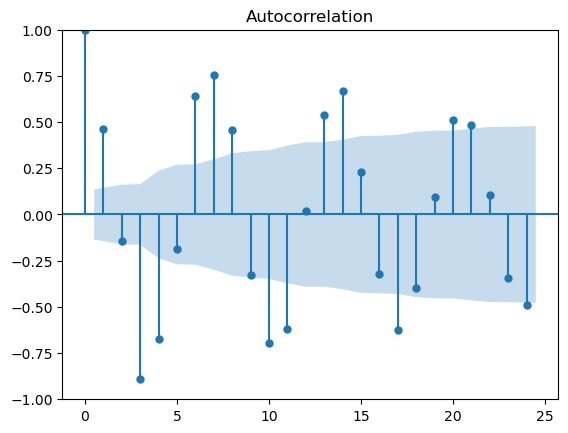

In [204]:
plot_acf(data12)  # autocorrelation plot 

In [205]:
data13 = data12.diff(periods=3)  # differencing applied to data12
data13 = data13.iloc[3:,:]  # null value discarded
data13  # integreted order of 13

,Cases
Date,
2020-02-28,0.0
2020-02-29,-154.0
2020-03-01,-220.0
2020-03-02,2.0
2020-03-03,54.0
...,...
2020-09-17,-6056768.0
2020-09-18,-15775516.0
2020-09-19,-4294969.0


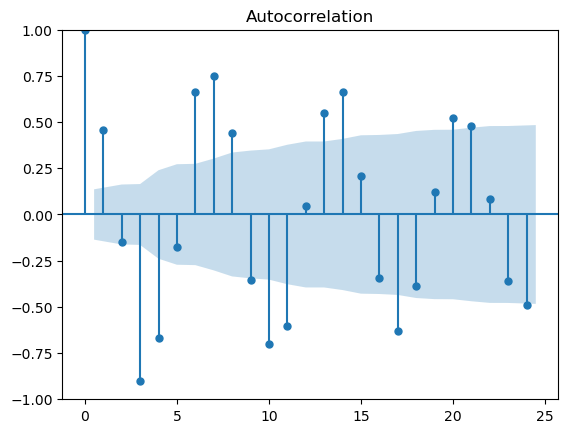

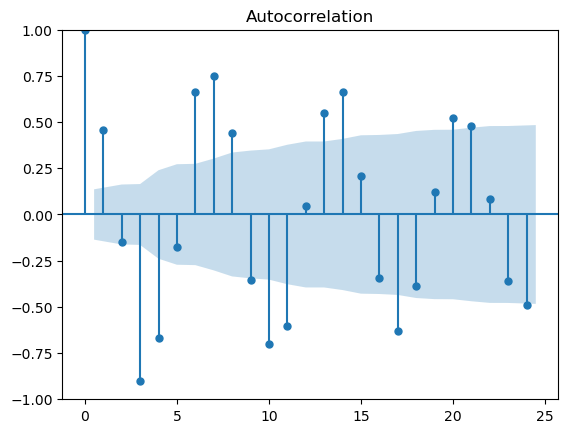

In [206]:
plot_acf(data13)  # autocorrelation plot 

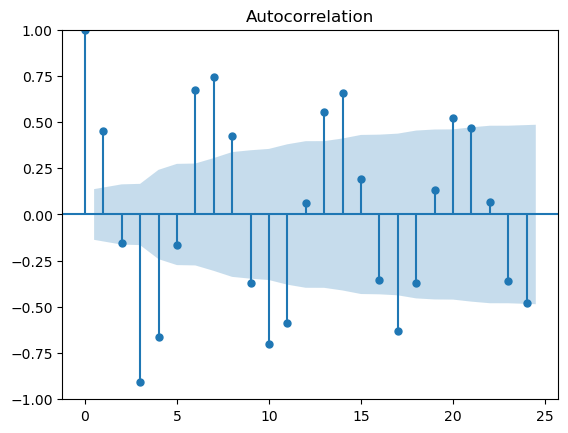

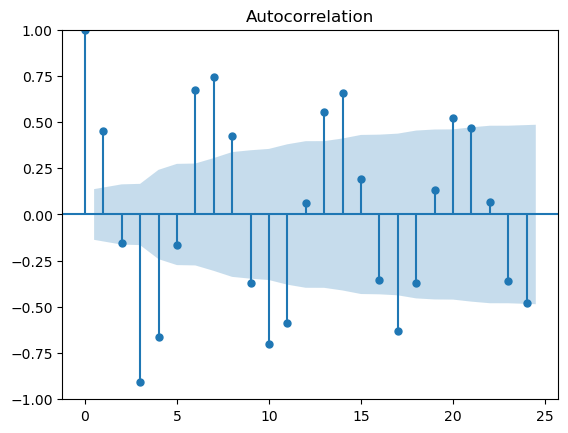

In [207]:
# integreted order of 14
data14 = data13.diff(periods=3)  # differencing applied to data13
data14 = data14.iloc[3:,:]  # null value discarded
plot_acf(data14)   # autocorrelation plot 

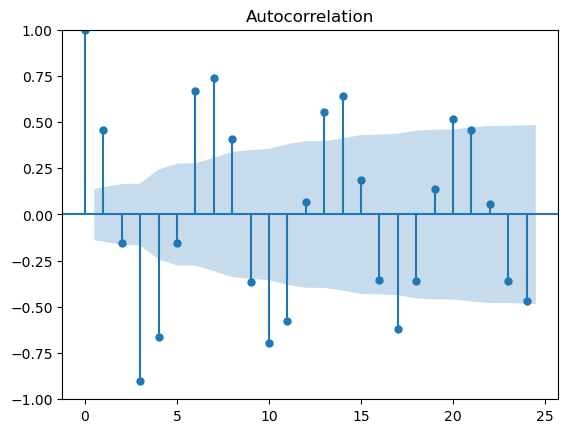

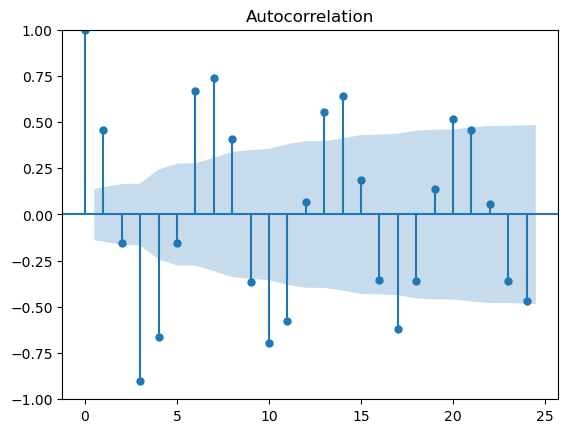

In [208]:
# integreted order of 15
data15 = data14.diff(periods=3)  # differencing applied to data14
data15 = data15.iloc[3:,:]  # null value discarded
plot_acf(data15)  # autocorrelation plot 

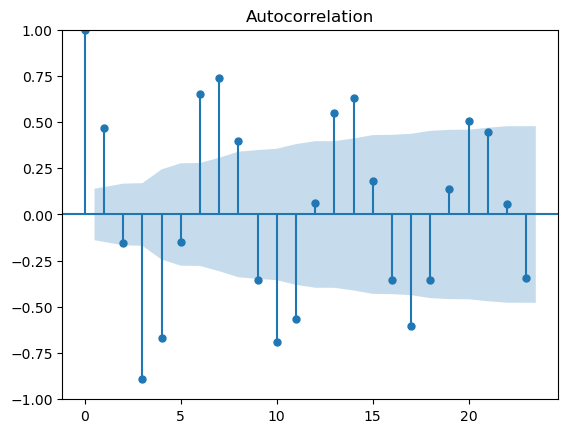

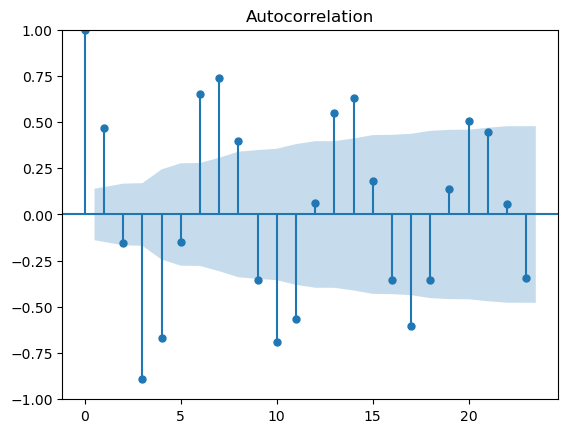

In [209]:
# integreted order of 16
data16 = data15.diff(periods=3)  # differencing applied to data15
data16 = data16.iloc[3:,:]  # null value discarded
plot_acf(data16)  # autocorrelation plot 

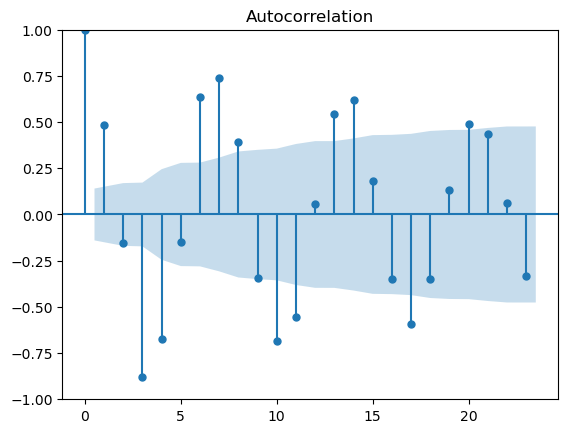

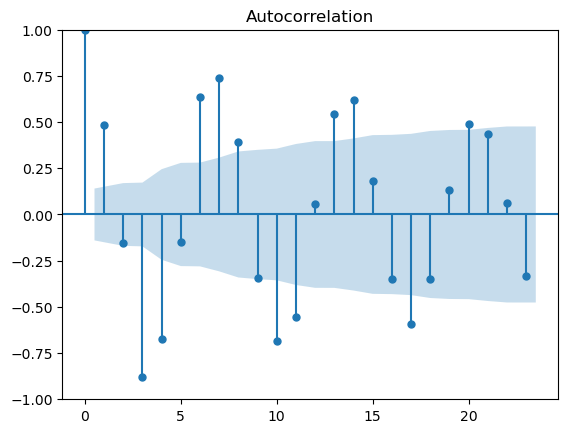

In [210]:
# integreted order of 17
data17 = data16.diff(periods=3)  # differencing applied to data16
data17 = data17.iloc[3:,:]  # null value discarded
plot_acf(data17)  # autocorrelation plot 

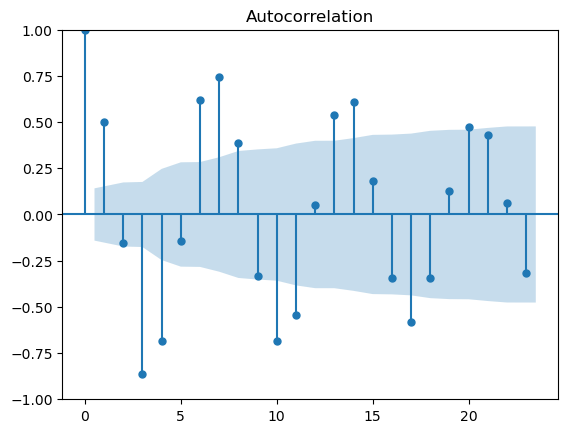

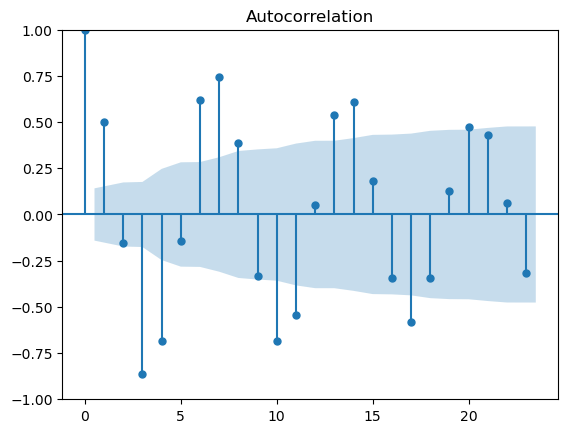

In [211]:
# integreted order of 18
data18 = data17.diff(periods=3)  # differencing applied to data17
data18 = data18.iloc[3:,:]  # null value discarded
plot_acf(data18)  # autocorrelation plot 

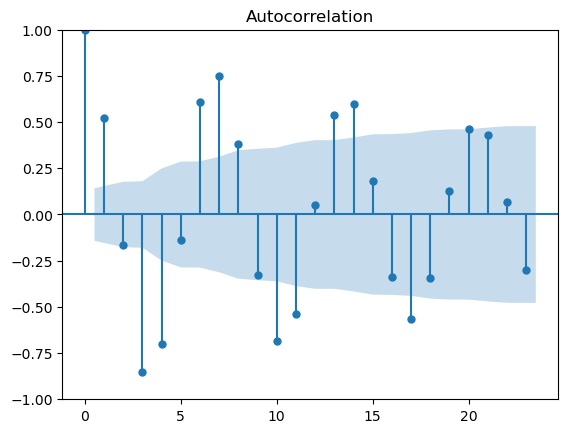

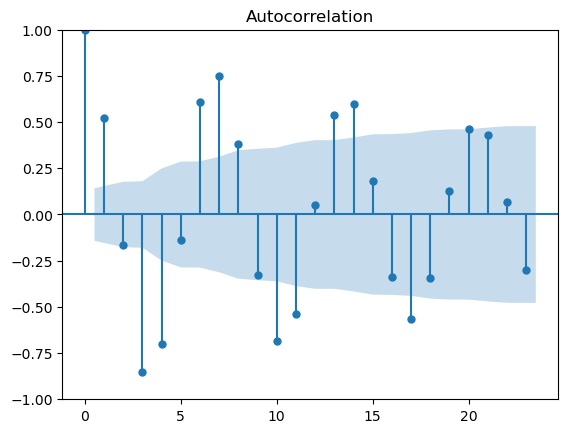

In [212]:
# integreted order of 19
data19 = data18.diff(periods=3)  # differencing applied to data18
data19 = data19.iloc[3:,:]  # null value discarded
plot_acf(data19)  # autocorrelation plot 

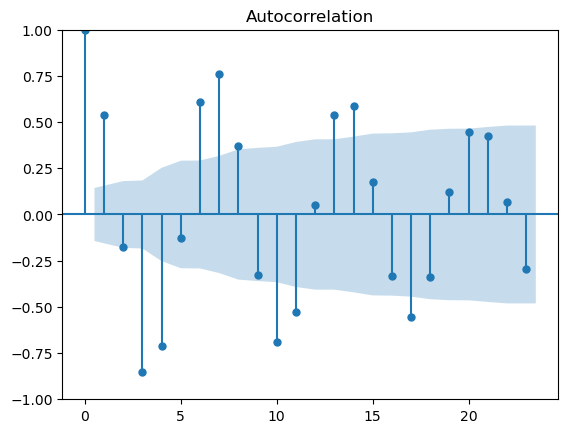

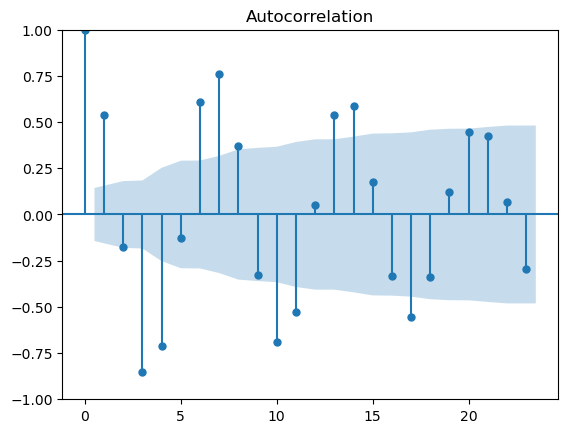

In [213]:
# integreted order of 20
data20 = data19.diff(periods=3)  # differencing applied to data19
data20 = data20.iloc[3:,:]  # null value discarded
plot_acf(data20)  # autocorrelation plot 

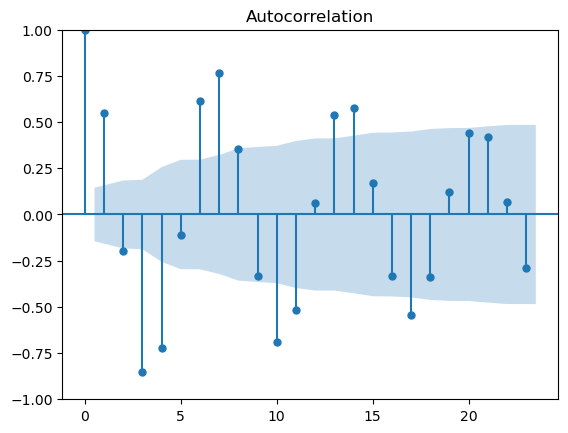

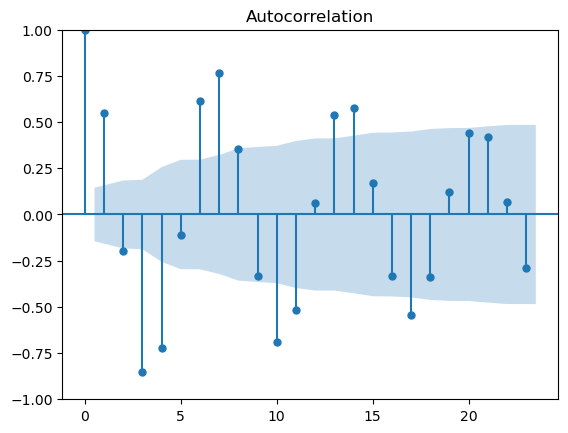

In [214]:
# integreted order of 21
data21 = data20.diff(periods=3)  # differencing applied to data20
data21 = data21.iloc[3:,:]  # null value discarded
plot_acf(data21)  # autocorrelation plot 

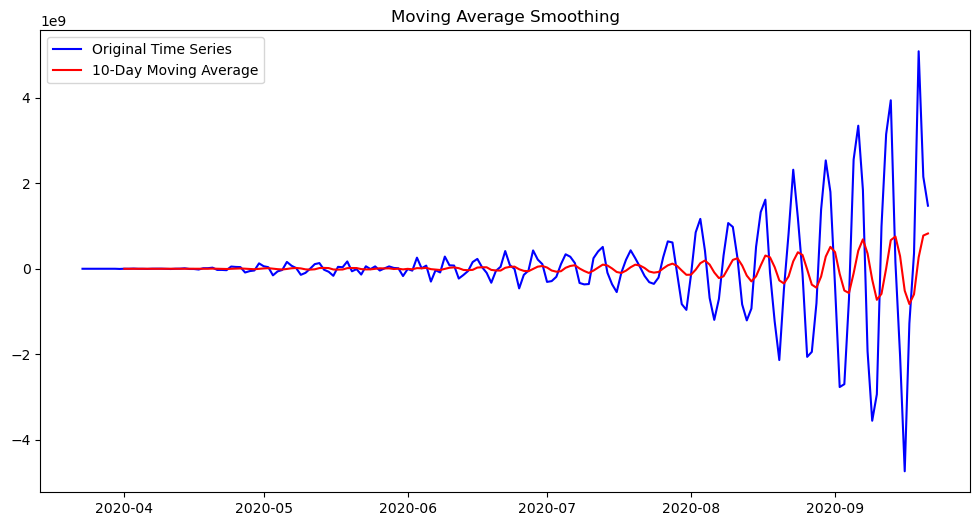

In [215]:
# appling the moving average for smooth the graph
window_size = 10  # Define the window size
moving_avg_series = data21.rolling(window=window_size).mean()

# Plot the moving average smoothed series
plt.figure(figsize=(12, 6))
plt.plot(data21, label="Original Time Series", color="blue")
plt.plot(moving_avg_series, label=f"{window_size}-Day Moving Average", color="red")
plt.title("Moving Average Smoothing")
plt.legend()
plt.show()

In [216]:
data21.shape  #shape of the data rows and columns  

(183, 1)

In [217]:
# Creating training and test data
train = data21[:165]#from 0th row to 164th row - traning data
test = data21[165:]   #from 165th row to end - testing data

In [218]:
from statsmodels.tsa.ar_model import AutoReg  # import AutoReg

In [219]:
# to select the optimal value of lags
from statsmodels.tsa.ar_model import ar_select_order
mod = ar_select_order(data21, maxlag=15, glob=True) #global search over all possible lag lengths (up to the maxlag you specify) to find best model
mod.ar_lags

C:\Users\admin\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\admin\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


[2, 3, 4, 5, 6, 8, 9, 11, 12, 15]

In [220]:
# model creation
ar_model = AutoReg(train, lags=mod.ar_lags)  ## object creation with lags specified
ar_model_fit = ar_model.fit()  # train the model

C:\Users\admin\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


In [221]:
len(test)  # check the length of testing data

18

In [222]:
prediction = ar_model_fit.predict(start=165, end=182)  # predict the model

In [223]:
case_r2_8 = r2_score(test,prediction)  # check the model performance
case_r2_8

0.9306928724771079

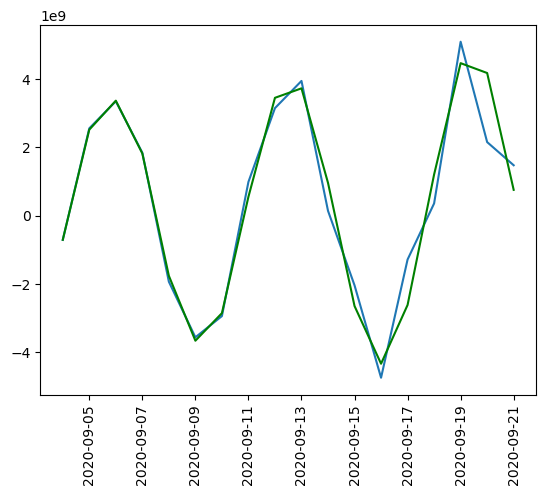

In [224]:
# plot the test and prediction data
plt.plot(test)
plt.plot(prediction, color='green')
plt.xticks(rotation=90)
plt.show()

**Conclusion**
* AutoRegression model in time series gives the model performance 0.93 for confiremed cases in india.
* In forecasting prediction, the time series analysis is more effective.

### ARIMA Model

#### **Fit the death cases of india**

In [225]:
# assign the date and Deaths of india
df = death_case.loc[death_case['Country/Region']=='India'][['Date','Deaths']]
df

,Date,Deaths
143,2020-01-22,0
409,2020-01-23,0
675,2020-01-24,0
941,2020-01-25,0
1207,2020-01-26,0
...,...,...
63717,2020-09-17,84372
63983,2020-09-18,85619
64249,2020-09-19,86752
64515,2020-09-20,87882


In [226]:
df = df.set_index('Date')   # set the Date as index
df

,Deaths
Date,
2020-01-22,0
2020-01-23,0
2020-01-24,0
2020-01-25,0
2020-01-26,0
...,...
2020-09-17,84372
2020-09-18,85619
2020-09-19,86752


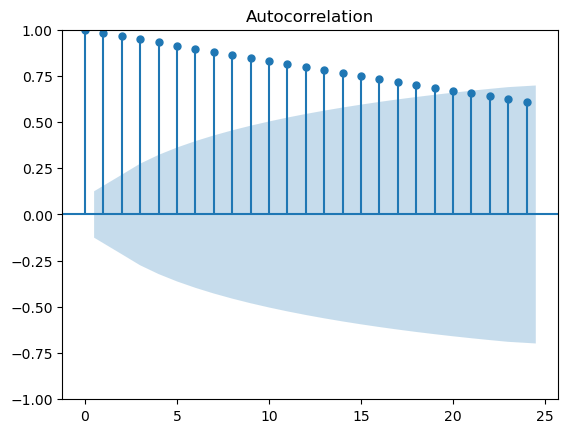

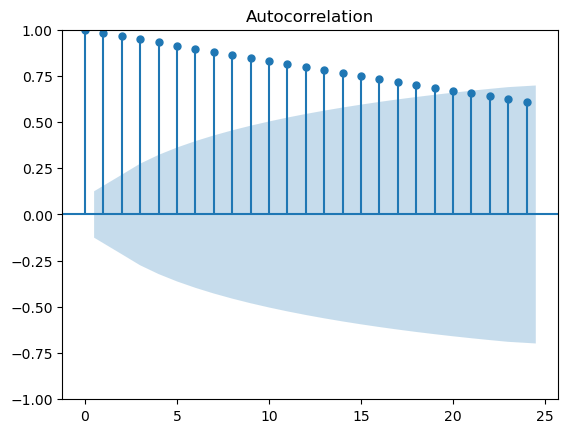

In [227]:
plot_acf(df)  # autocorrelation plot 

In [228]:
df.shape  # check the shape of data

(244, 1)

In [229]:
# creating training and testing data
train = df[:180]  #from 0th row to 179th row - traning data
test = df[180:]  #from 180th row to end - testing data

In [230]:
# importing the ARIMA library
from statsmodels.tsa.arima.model import ARIMA

In [231]:
##Model object creation and fitting the model Moving Average
model_arima = ARIMA(train, order=(2,4,4))#order

model_arima_fit = model_arima.fit() #train the model

C:\Users\admin\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\admin\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
C:\Users\admin\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


In [232]:
log_likelyhood = model_arima_fit.llf  # likelyhood value used for calculate aic
log_likelyhood

-1122.2652166848684

In [233]:
len(model_arima_fit.params)  # check the len f parameters/ orders
# it gives the total-1

7

In [234]:
-2*-1122.2652166848684+2*7  # calculate the aic

2258.530433369737

In [235]:
## evaluate the model
print(model_arima_fit.aic)  # aic is used to calculate error of model

2258.530433369737


In [236]:
test.size  # check the testing data size

64

In [237]:
# predicting the output of sample points
predictions = model_arima_fit.forecast(steps=64)

In [238]:
predictions  # check predictions

2020-07-20    28134.325999
2020-07-21    28780.709282
2020-07-22    29436.357310
2020-07-23    30101.489414
2020-07-24    30776.017374
                  ...     
2020-09-17    84358.132728
2020-09-18    85666.395829
2020-09-19    86987.896239
2020-09-20    88322.546193
2020-09-21    89670.562879
Freq: D, Name: predicted_mean, Length: 64, dtype: float64

In [239]:
death_r2_8 = r2_score(test,predictions)  # check the model performance
death_r2_8

0.9953612529281676

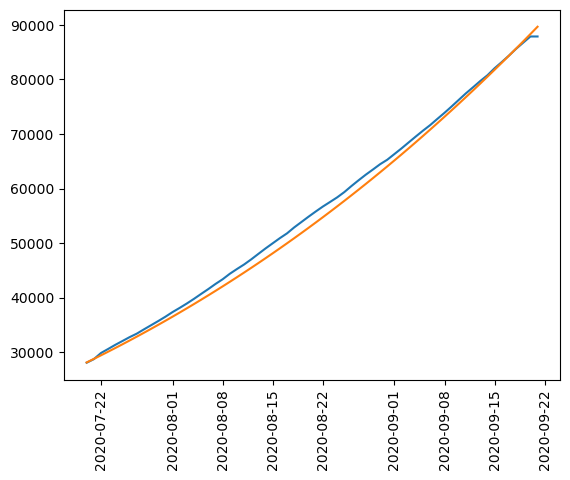

In [240]:
# plot the test and prediction data
plt.plot(test)
plt.plot(predictions)
plt.xticks(rotation=90)
plt.show()

**Conclusion**
* ARIMA model in time series gives the model performance 0.9953 for death cases in india.
* In forecasting prediction, the time series analysis is more effective.

## Model Comparision Report

In [241]:
# make a table for all algorithm's performance and error
score = pd.DataFrame({"Model":["Linear Regression","KNN","Decision Tree Regressor","Bagging",
                        "Random Forest Regressor","Gradient Boosting","XGB Regressor","Time Series"],
                     "R2_score for Confiremed Cases of India":[case_r2_1*100,case_r2_2*100,case_r2_3*100,case_r2_4*100,case_r2_5*100,
                                                               case_r2_6*100,case_r2_7*100,case_r2_8*100],
                     "R2_score for Death Cases of India":[death_r2_1*100,death_r2_2*100,death_r2_3*100,death_r2_4*100,death_r2_5*100,
                                                          death_r2_6*100,death_r2_7*100,death_r2_8*100]})

In [242]:
score

,Model,R2_score for Confiremed Cases of India,R2_score for Death Cases of India
0,Linear Regression,99.850678,99.919268
1,KNN,99.920582,99.955809
2,Decision Tree Regressor,99.896432,99.934557
3,Bagging,99.946428,99.965254
4,Random Forest Regressor,99.952843,99.971862
5,Gradient Boosting,99.897144,99.937261
6,XGB Regressor,99.774207,99.863089
7,Time Series,93.069287,99.536125


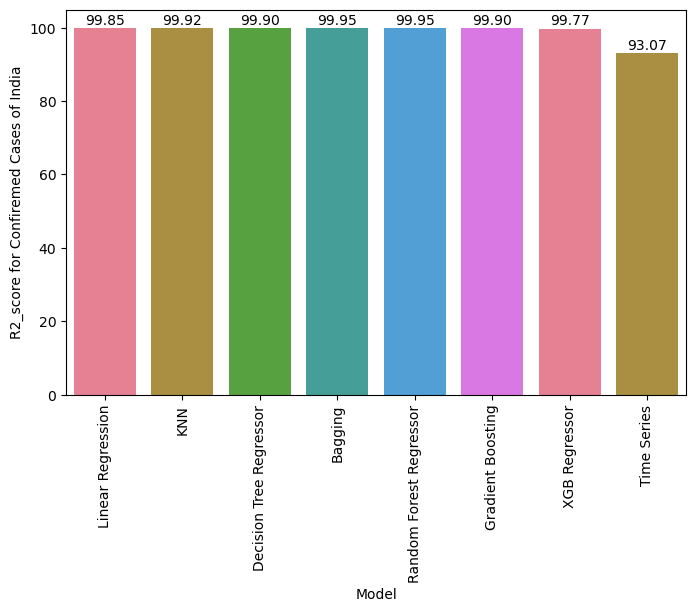

In [243]:
# use for All model performance show in barplot graph
palette = sns.color_palette("husl") # define the color for barplot 
plt.figure(figsize=(8, 5)) # define the plot size
plt.xticks(rotation = 90) # rotation x ticks
a = sns.barplot(x=score.Model, y=score['R2_score for Confiremed Cases of India'], data=score, palette=palette) # create the barplot

for index, value in enumerate(score['R2_score for Confiremed Cases of India']): # show indivisual bar values show
    a.text(index, value + 1, f'{value:.2f}', ha='center')

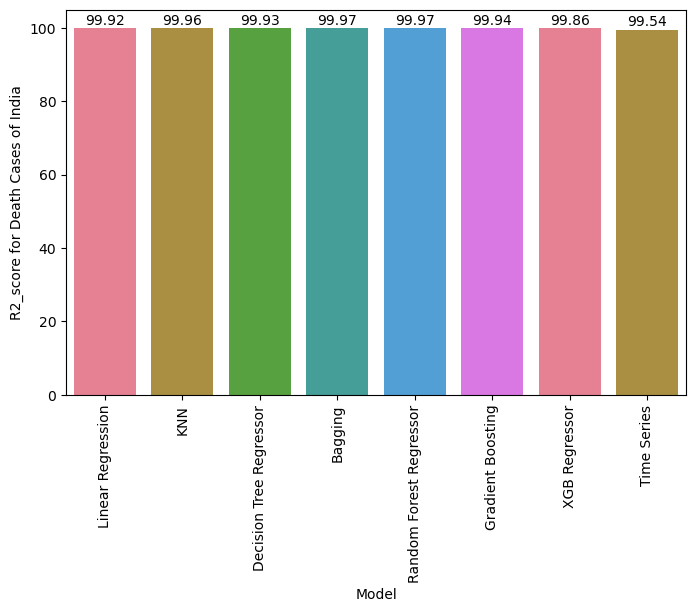

In [244]:
# use for All model performance show in barplot graph
palette = sns.color_palette("husl") # define the color for barplot 
plt.figure(figsize=(8, 5)) # define the plot size
plt.xticks(rotation = 90) # rotation x ticks
a = sns.barplot(x=score.Model, y=score['R2_score for Death Cases of India'], data=score, palette=palette) # create the barplot

for index, value in enumerate(score['R2_score for Death Cases of India']): # show indivisual bar values show
    a.text(index, value + 1, f'{value:.2f}', ha='center')

#### **Final Conclusion**

* I predict the confiremed cases of india and death cases of India where I have used 8 Algorithms like Linear Regression, KNN, Decision Tree, Bagging Algorithm, Random Forest, Gradient Boosting, XGB Regressor and Time Series.
* There are all algorithms gives generalized model and all algorithm provides the model performance grater than 90%.
* Random Forest is generalized model and gives highest r2_score 99.95 for confiremed cases and highest r2_score 99.97 for death cases of india.
* Many algorithm gives the 99% performance on the data of confiremed cases and death cases of india.
* Time Series model gives the r2_score 93.07 for confiremed cases and 99.54 for death cases of India.
* the primary goal is to forecast based primarily on past case numbers with a clear trend or seasonality, a time series model is better.

## Report on Challenges Faced

**Temporal Complexity**: Capturing seasonal trends and sudden spikes in case numbers can be tough.\
**Data Quality Issues**: Missing values, inconsistent reporting, and data reliability vary across regions.\
**External Influences**: Policy changes, mobility, and testing rates affect case numbers but may not be in the dataset.\
**Modeling Complexity**: Choosing and tuning the right model without overfitting and managing computational demands are critical for accuracy.\
**Computational Time** : With the covid19 forecast dataset and different algorithms, training models took a significant amount of time, especially during the train the time series models.

### Suggestions to the government health department 

Bases on the confiremed cases and the death cases of india prediction, we gives ther suggestions to the government health department that Consider temporary lockdowns or movement restrictions in hotspots to control spread. Prepare hospitals by increasing staff, ICU beds, and essential supplies like oxygen and ventilators. and give the Prioritize vaccinations or boosters in vulnerable areas to reduce severe cases. Additionally, intensified public messaging on preventive behaviors—like mask-wearing and social distancing—will be crucial to slowing transmission and lessening strain on healthcare resources.

## Save the Model 

Auto Regression and ARIMA is designed for time-series forecasting and tends to capture temporal patterns more reliably, making it likely to generalize better. so we save the Auto Regression model for confirmed cases of India and ARIMA model for death cases of India in the pickle file.

In [250]:
import pickle   #used for save the model

In [251]:
# save the AR model for confirmed cases of india
with open('Confiremed_case_India.pkl','wb') as file : # save the file name
    pickle.dump(ar_model_fit,file) #dump the ar_model_fit model 

In [255]:
with open('Confiremed_case_India.pkl','rb') as file : # call the file
    ar_model = pickle.load(file)  # load the file

In [258]:
# predict the data
predictions = ar_model.predict(start=240, end=250)
print(predictions)

2020-11-18   -7.956419e+09
2020-11-19    2.290882e+10
2020-11-20    3.531023e+10
2020-11-21    2.194773e+10
2020-11-22   -1.240124e+10
2020-11-23   -3.686881e+10
2020-11-24   -3.495795e+10
2020-11-25   -2.685441e+09
2020-11-26    3.276739e+10
2020-11-27    4.465444e+10
2020-11-28    2.071530e+10
Freq: D, dtype: float64


In [253]:
# save the arima model for death cases of india
with open('Death_case_India.pkl','wb') as file : # save the file name
    pickle.dump(model_arima_fit,file) #dump the model_arima_fit model 

In [256]:
with open('Death_case_India.pkl','rb') as file : # call the file
   arima_model = pickle.load(file)  # load the file

In [259]:
# predict the data
predictions = arima_model.predict(start=240, end=250)
print(predictions)

2020-09-18    85666.395829
2020-09-19    86987.896239
2020-09-20    88322.546193
2020-09-21    89670.562879
2020-09-22    91031.858545
2020-09-23    92406.650365
2020-09-24    93794.850602
2020-09-25    95196.676415
2020-09-26    96612.040083
2020-09-27    98041.158747
2020-09-28    99483.944705
Freq: D, Name: predicted_mean, dtype: float64


                                                         --- Thank You ---